<a href="https://colab.research.google.com/github/Anas-Seutia/Fall-Detection/blob/main/FallDetection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install mediapipe

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import cv2
import mediapipe as mp
from google.colab.patches import cv2_imshow
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
Falling_path = '/content/drive/MyDrive/Projects/Computer Vision/Fall Detection/Falling.mp4'
Sitting_path = '/content/drive/MyDrive/Projects/Computer Vision/Fall Detection/Sitting.mp4'
Walking_path = '/content/drive/MyDrive/Projects/Computer Vision/Fall Detection/Walking.mp4'

In [ ]:
def detect_mp4(video):
  mp_drawing = mp.solutions.drawing_utils
  mp_pose = mp.solutions.pose

  POSE_CONFIDENCE_THRESHOLD = 0.5
  with mp_pose.Pose(
      min_detection_confidence = POSE_CONFIDENCE_THRESHOLD,
      min_tracking_confidence = POSE_CONFIDENCE_THRESHOLD
  ) as pose:
      
      cap = cv2.VideoCapture(video)

      prev_centroid_y = None
      fall_frames = 0
      fall_threshold = 10
      centroid_drop_threshold = 0.3

      while cap.isOpened():
          ret, frame = cap.read()
          if not ret:
              break

          image = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

          results = pose.process(image)

          #Check if any pose is detected
          if results.pose_landmarks:
              #Get the bounding box coordinates of the person
              bbox_min_x = min(landmark.x for landmark in results.pose_landmarks.landmark)
              bbox_max_x = max(landmark.x for landmark in results.pose_landmarks.landmark)
              bbox_min_y = min(landmark.y for landmark in results.pose_landmarks.landmark)
              bbox_max_y = max(landmark.y for landmark in results.pose_landmarks.landmark)
              bbox_width = (bbox_max_x - bbox_min_x) * frame.shape[1]
              bbox_height = (bbox_max_y - bbox_min_y) *frame.shape[0]

              #Calculate the centroid of the person
              centroid_x = bbox_min_x + (bbox_width / 2)
              centroid_y = bbox_min_y + (bbox_height / 2)

              centroid_drop = 0

              #Check if centroid position moved down
              if prev_centroid_y is not None:
                  centroid_drop = prev_centroid_y - centroid_y
                  significant_drop = centroid_drop > centroid_drop_threshold
                  fall_frames += 1 if significant_drop else 0
              else:
                  fall_frames = 0

              #Check if person has fallen based on the condition:
              is_falling = fall_frames >= fall_threshold
              has_fallen = fall_frames >= fall_threshold and bbox_width > bbox_height

              #Display  bounding box
              cv2.rectangle(frame, (int(bbox_min_x * frame.shape[1]), int(bbox_min_y * frame.shape[0])),
                            (int(bbox_max_x * frame.shape[1]), int(bbox_max_y * frame.shape[0])), (0, 255, 0), 2)

              #Display centroid position
              # Draw the centroid on the frame
              cv2.circle(frame, (int(centroid_x * frame.shape[1]), int(centroid_y * frame.shape[0])), 5, (255, 0, 0), -1)

              mp_drawing.draw_landmarks(
                  frame,
                  results.pose_landmarks,
                  mp_pose.POSE_CONNECTIONS,
                  mp_drawing.DrawingSpec(color=(0, 255, 0), thickness=2, circle_radius=2),
                  mp_drawing.DrawingSpec(color=(0, 0, 255), thickness=2)
              )

              cv2_imshow(frame)

              if has_fallen:
                  print("\033[1m\033[92mFALL DETECTED!!\033[0m")
              elif is_falling:
                  print("\033[1m\033[92mFALLING DETECTED!\033[0m")
              else:
                  print("\033[1m\033[91mno fall detected\033[0m")
              print("centroid drop: ", centroid_drop)
              print("fall frames: ", fall_frames)
              print("fall threshold: ", fall_threshold)
              print("box width: ", bbox_width)
              print("box height: ", bbox_height)

          prev_centroid_y = centroid_y

      # Release the video capture and close the windows
      cap.release()
      cv2.destroyAllWindows()

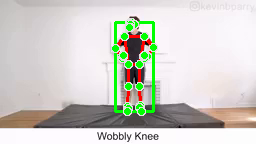

no fall detected
centroid drop:  0
fall frames:  0
fall threshold:  10
box width:  38.357147216796875
box height:  88.61653804779053


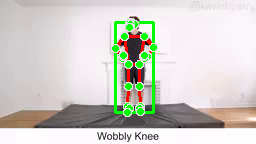

no fall detected
centroid drop:  -0.34011000394821167
fall frames:  0
fall threshold:  10
box width:  38.18138122558594
box height:  89.29805088043213


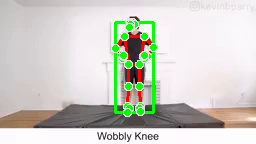

no fall detected
centroid drop:  -0.09634561836719513
fall frames:  0
fall threshold:  10
box width:  38.075584411621094
box height:  89.4907557964325


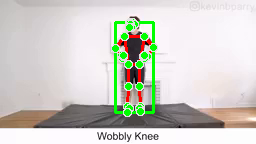

no fall detected
centroid drop:  -0.16480039060115814
fall frames:  0
fall threshold:  10
box width:  38.01499938964844
box height:  89.81943798065186


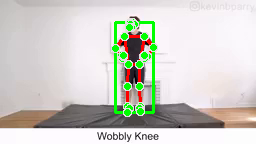

no fall detected
centroid drop:  -0.05709272623062134
fall frames:  0
fall threshold:  10
box width:  38.00376892089844
box height:  89.933180809021


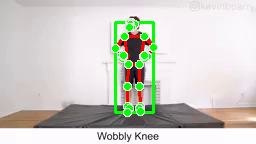

no fall detected
centroid drop:  -0.01792474091053009
fall frames:  0
fall threshold:  10
box width:  38.015411376953125
box height:  89.96850657463074


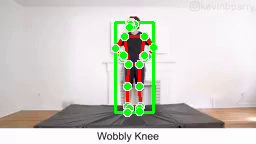

no fall detected
centroid drop:  0.01934899389743805
fall frames:  0
fall threshold:  10
box width:  38.02696228027344
box height:  89.92980766296387


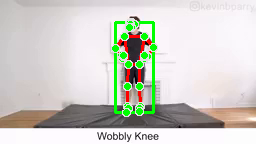

no fall detected
centroid drop:  0.06224328279495239
fall frames:  0
fall threshold:  10
box width:  38.01213836669922
box height:  89.80532741546631


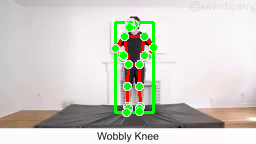

no fall detected
centroid drop:  0.019283875823020935
fall frames:  0
fall threshold:  10
box width:  38.004737854003906
box height:  89.76671862602234


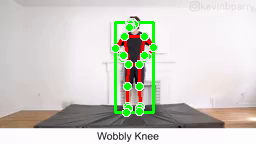

no fall detected
centroid drop:  -0.0036232322454452515
fall frames:  0
fall threshold:  10
box width:  37.978233337402344
box height:  89.77418804168701


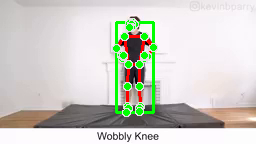

no fall detected
centroid drop:  0.21432437002658844
fall frames:  0
fall threshold:  10
box width:  37.94694519042969
box height:  89.34590363502502


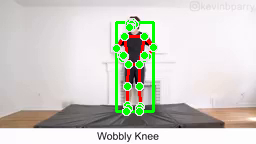

no fall detected
centroid drop:  0.1742725968360901
fall frames:  0
fall threshold:  10
box width:  37.93389129638672
box height:  88.99746537208557


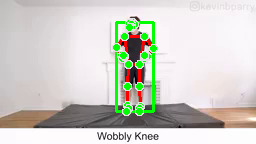

no fall detected
centroid drop:  0.12359824776649475
fall frames:  0
fall threshold:  10
box width:  37.9337158203125
box height:  88.74993395805359


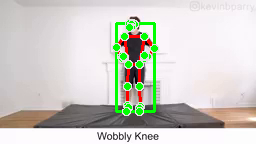

no fall detected
centroid drop:  0.21678541600704193
fall frames:  0
fall threshold:  10
box width:  37.956031799316406
box height:  88.31446981430054


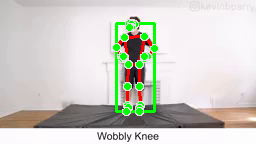

no fall detected
centroid drop:  0.10713241994380951
fall frames:  0
fall threshold:  10
box width:  37.961769104003906
box height:  88.09894680976868


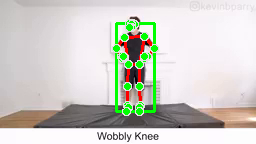

no fall detected
centroid drop:  0.1692664921283722
fall frames:  0
fall threshold:  10
box width:  37.983734130859375
box height:  87.75849509239197


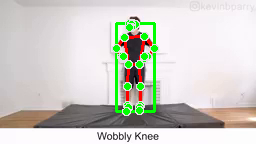

no fall detected
centroid drop:  0.09016956388950348
fall frames:  0
fall threshold:  10
box width:  38.01210021972656
box height:  87.5758581161499


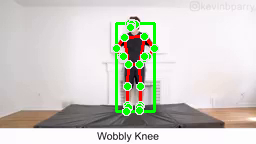

no fall detected
centroid drop:  0.06629930436611176
fall frames:  0
fall threshold:  10
box width:  38.036048889160156
box height:  87.44174551963806


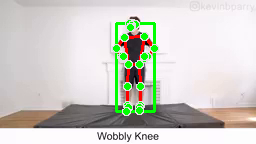

no fall detected
centroid drop:  0.05276875197887421
fall frames:  0
fall threshold:  10
box width:  38.06150817871094
box height:  87.33474683761597


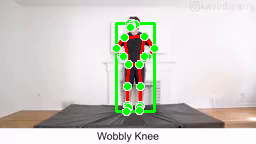

no fall detected
centroid drop:  -0.0013644397258758545
fall frames:  0
fall threshold:  10
box width:  38.06177520751953
box height:  87.3372745513916


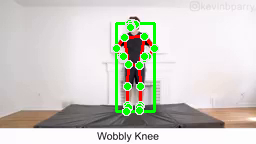

no fall detected
centroid drop:  -0.009212508797645569
fall frames:  0
fall threshold:  10
box width:  38.07167053222656
box height:  87.35577750205994


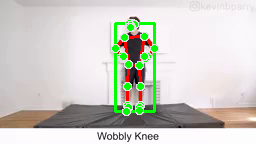

no fall detected
centroid drop:  -0.011409163475036621
fall frames:  0
fall threshold:  10
box width:  38.152809143066406
box height:  87.37878012657166


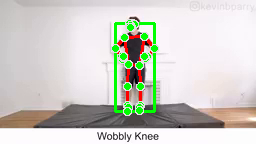

no fall detected
centroid drop:  -0.170859232544899
fall frames:  0
fall threshold:  10
box width:  38.20494842529297
box height:  87.72133684158325


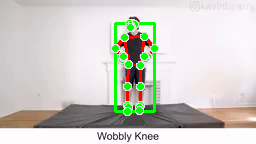

no fall detected
centroid drop:  -0.14366048574447632
fall frames:  0
fall threshold:  10
box width:  38.28912353515625
box height:  88.0088438987732


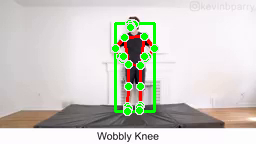

no fall detected
centroid drop:  -0.06811942160129547
fall frames:  0
fall threshold:  10
box width:  38.37493133544922
box height:  88.14513230323792


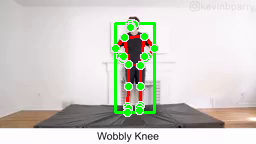

no fall detected
centroid drop:  -0.15099099278450012
fall frames:  0
fall threshold:  10
box width:  38.46240234375
box height:  88.44817900657654


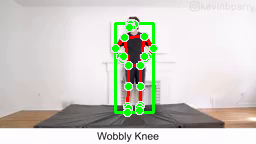

no fall detected
centroid drop:  -0.12827911972999573
fall frames:  0
fall threshold:  10
box width:  38.47753143310547
box height:  88.70603585243225


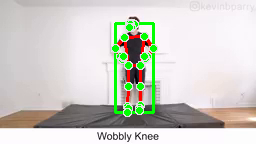

no fall detected
centroid drop:  -0.1318109780550003
fall frames:  0
fall threshold:  10
box width:  38.386390686035156
box height:  88.97006607055664


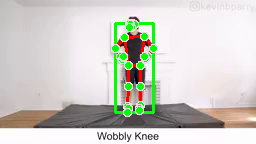

no fall detected
centroid drop:  -0.011376902461051941
fall frames:  0
fall threshold:  10
box width:  38.24279022216797
box height:  88.9933454990387


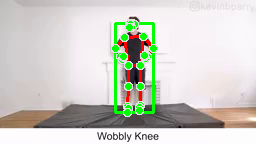

no fall detected
centroid drop:  0.08631230890750885
fall frames:  0
fall threshold:  10
box width:  38.09728240966797
box height:  88.82123136520386


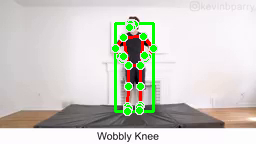

no fall detected
centroid drop:  0.12215104699134827
fall frames:  0
fall threshold:  10
box width:  37.94879150390625
box height:  88.57730484008789


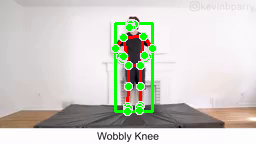

no fall detected
centroid drop:  0.08667080104351044
fall frames:  0
fall threshold:  10
box width:  37.81798553466797
box height:  88.40396761894226


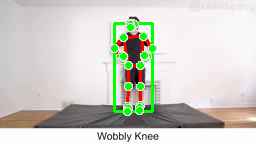

no fall detected
centroid drop:  -0.11895790696144104
fall frames:  0
fall threshold:  10
box width:  37.84593200683594
box height:  88.64167141914368


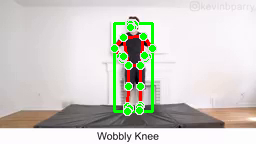

no fall detected
centroid drop:  0.06328831613063812
fall frames:  0
fall threshold:  10
box width:  37.917755126953125
box height:  88.51339530944824


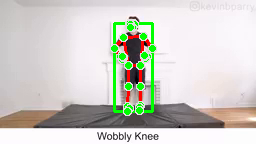

no fall detected
centroid drop:  0.10198403894901276
fall frames:  0
fall threshold:  10
box width:  37.78105926513672
box height:  88.30858826637268


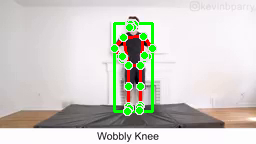

no fall detected
centroid drop:  0.005353555083274841
fall frames:  0
fall threshold:  10
box width:  37.65287780761719
box height:  88.29827785491943


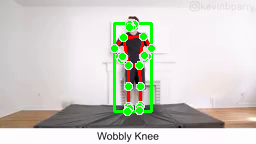

no fall detected
centroid drop:  -0.05974559485912323
fall frames:  0
fall threshold:  10
box width:  37.475135803222656
box height:  88.41845154762268


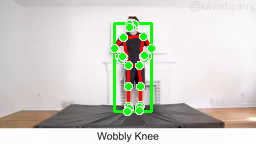

no fall detected
centroid drop:  0.01754005253314972
fall frames:  0
fall threshold:  10
box width:  37.33190155029297
box height:  88.38337469100952


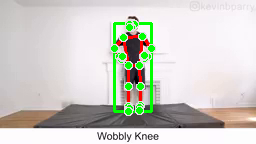

no fall detected
centroid drop:  -0.01342780888080597
fall frames:  0
fall threshold:  10
box width:  37.325469970703125
box height:  88.41022038459778


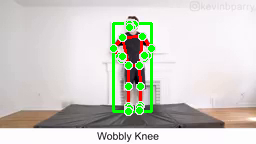

no fall detected
centroid drop:  -0.014569833874702454
fall frames:  0
fall threshold:  10
box width:  37.41345977783203
box height:  88.43998432159424


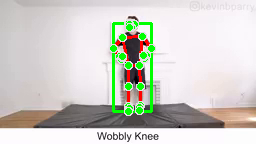

no fall detected
centroid drop:  -0.05955132842063904
fall frames:  0
fall threshold:  10
box width:  37.58088684082031
box height:  88.5610785484314


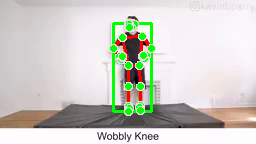

no fall detected
centroid drop:  -0.034957051277160645
fall frames:  0
fall threshold:  10
box width:  37.831275939941406
box height:  88.63201761245728


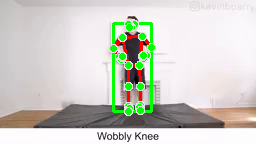

no fall detected
centroid drop:  -0.017439186573028564
fall frames:  0
fall threshold:  10
box width:  37.898895263671875
box height:  88.6674485206604


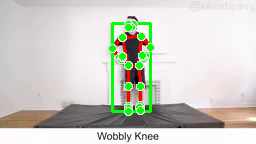

no fall detected
centroid drop:  0.00020299851894378662
fall frames:  0
fall threshold:  10
box width:  37.833763122558594
box height:  88.66704297065735


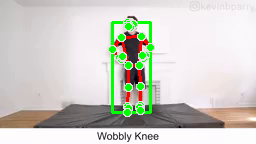

no fall detected
centroid drop:  -0.43320246040821075
fall frames:  0
fall threshold:  10
box width:  37.81156921386719
box height:  89.53730392456055


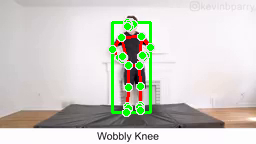

no fall detected
centroid drop:  0.01858140528202057
fall frames:  0
fall threshold:  10
box width:  37.85686492919922
box height:  89.50011563301086


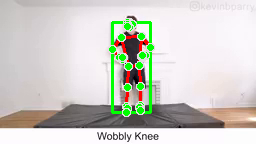

no fall detected
centroid drop:  -0.004408895969390869
fall frames:  0
fall threshold:  10
box width:  37.72789764404297
box height:  89.5091450214386


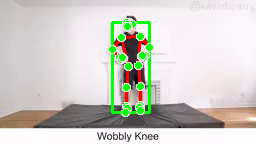

no fall detected
centroid drop:  0.006185457110404968
fall frames:  0
fall threshold:  10
box width:  37.60730743408203
box height:  89.496826171875


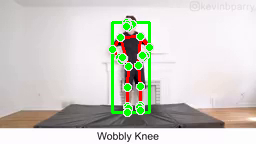

no fall detected
centroid drop:  0.007545500993728638
fall frames:  0
fall threshold:  10
box width:  37.05286407470703
box height:  89.48192167282104


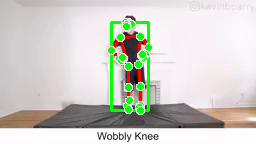

no fall detected
centroid drop:  0.8346400409936905
fall frames:  1
fall threshold:  10
box width:  36.990936279296875
box height:  87.81253409385681


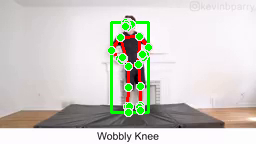

no fall detected
centroid drop:  -0.6911002695560455
fall frames:  1
fall threshold:  10
box width:  36.94782257080078
box height:  89.19471287727356


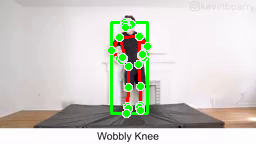

no fall detected
centroid drop:  -0.5015794485807419
fall frames:  1
fall threshold:  10
box width:  36.503448486328125
box height:  90.19744062423706


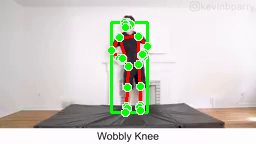

no fall detected
centroid drop:  0.07347708940505981
fall frames:  1
fall threshold:  10
box width:  36.11775207519531
box height:  90.05041265487671


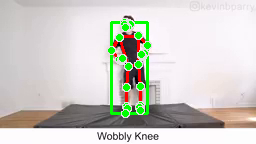

no fall detected
centroid drop:  0.008388623595237732
fall frames:  1
fall threshold:  10
box width:  35.758209228515625
box height:  90.0324375629425


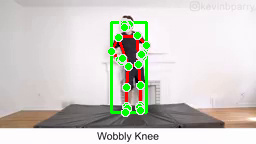

no fall detected
centroid drop:  0.016729652881622314
fall frames:  1
fall threshold:  10
box width:  34.930091857910156
box height:  89.99878334999084


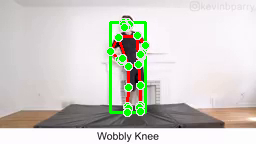

no fall detected
centroid drop:  0.2915402501821518
fall frames:  1
fall threshold:  10
box width:  34.424964904785156
box height:  89.41648864746094


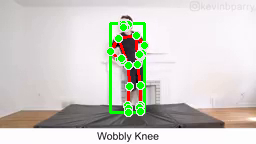

no fall detected
centroid drop:  0.16129057109355927
fall frames:  1
fall threshold:  10
box width:  34.567352294921875
box height:  89.09232974052429


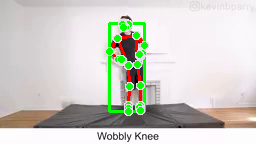

no fall detected
centroid drop:  0.26174670457839966
fall frames:  1
fall threshold:  10
box width:  34.91065979003906
box height:  88.56677985191345


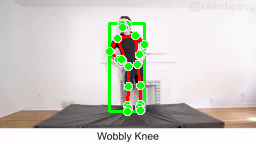

no fall detected
centroid drop:  -0.0028972476720809937
fall frames:  1
fall threshold:  10
box width:  34.71400451660156
box height:  88.57300472259521


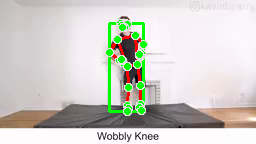

no fall detected
centroid drop:  0.27598799765110016
fall frames:  1
fall threshold:  10
box width:  33.72626495361328
box height:  88.0199224948883


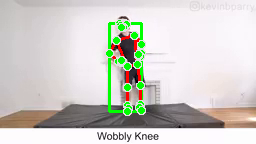

no fall detected
centroid drop:  0.09681899845600128
fall frames:  1
fall threshold:  10
box width:  32.279441833496094
box height:  87.8256983757019


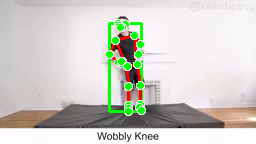

no fall detected
centroid drop:  0.019544899463653564
fall frames:  1
fall threshold:  10
box width:  32.09053039550781
box height:  87.7870831489563


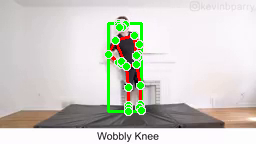

no fall detected
centroid drop:  -0.09424680471420288
fall frames:  1
fall threshold:  10
box width:  32.88532257080078
box height:  87.97572183609009


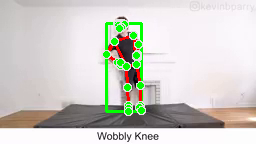

no fall detected
centroid drop:  0.05082195997238159
fall frames:  1
fall threshold:  10
box width:  34.397132873535156
box height:  87.87206411361694


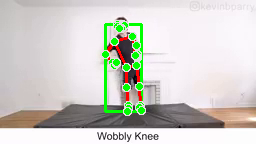

no fall detected
centroid drop:  0.3051399290561676
fall frames:  2
fall threshold:  10
box width:  35.67516326904297
box height:  87.25300598144531


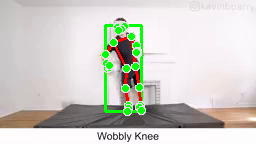

no fall detected
centroid drop:  0.5384898781776428
fall frames:  3
fall threshold:  10
box width:  36.289390563964844
box height:  86.16060447692871


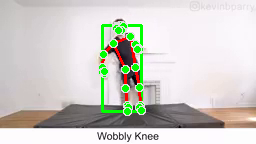

no fall detected
centroid drop:  0.42178739607334137
fall frames:  4
fall threshold:  10
box width:  38.990631103515625
box height:  85.30565571784973


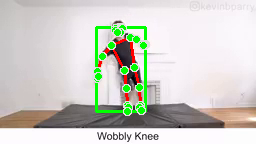

no fall detected
centroid drop:  0.9310832172632217
fall frames:  5
fall threshold:  10
box width:  48.707855224609375
box height:  83.4201979637146


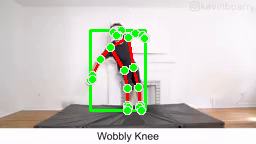

no fall detected
centroid drop:  1.7010505199432373
fall frames:  6
fall threshold:  10
box width:  55.47661590576172
box height:  79.97619867324829


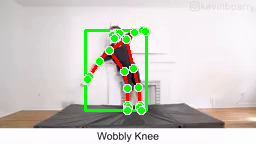

no fall detected
centroid drop:  -0.15504764020442963
fall frames:  6
fall threshold:  10
box width:  61.06671905517578
box height:  80.29018664360046


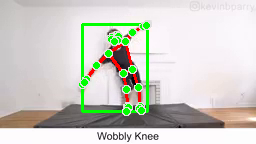

no fall detected
centroid drop:  -3.3049987256526947
fall frames:  6
fall threshold:  10
box width:  65.5486068725586
box height:  86.97770619392395


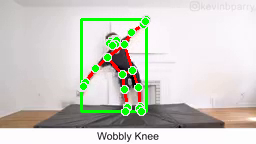

no fall detected
centroid drop:  -2.687423661351204
fall frames:  6
fall threshold:  10
box width:  64.84660339355469
box height:  92.4283390045166


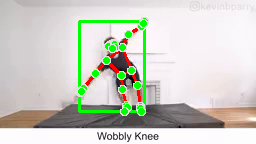

no fall detected
centroid drop:  1.2967229336500168
fall frames:  7
fall threshold:  10
box width:  64.18192291259766
box height:  89.80286192893982


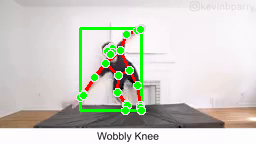

no fall detected
centroid drop:  3.690313369035721
fall frames:  8
fall threshold:  10
box width:  61.59877014160156
box height:  82.32474732398987


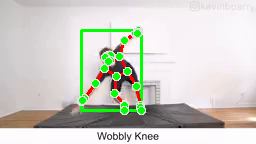

no fall detected
centroid drop:  1.0577094554901123
fall frames:  9
fall threshold:  10
box width:  60.140533447265625
box height:  80.18015599250793


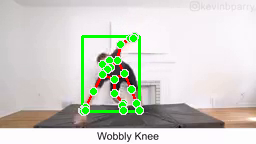

FALLING DETECTED!
centroid drop:  2.511772498488426
fall frames:  10
fall threshold:  10
box width:  56.78216552734375
box height:  75.0807638168335


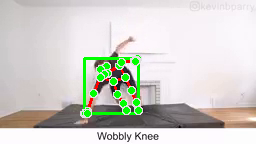

FALLING DETECTED!
centroid drop:  9.8637775182724
fall frames:  11
fall threshold:  10
box width:  54.00542449951172
box height:  55.03883457183838


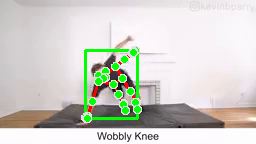

FALLING DETECTED!
centroid drop:  -6.6451930701732635
fall frames:  11
fall threshold:  10
box width:  52.09703826904297
box height:  68.44972085952759


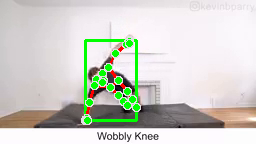

FALLING DETECTED!
centroid drop:  -5.941804468631744
fall frames:  11
fall threshold:  10
box width:  51.145416259765625
box height:  80.46775960922241


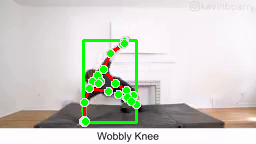

FALLING DETECTED!
centroid drop:  -0.5780957639217377
fall frames:  11
fall threshold:  10
box width:  52.689613342285156
box height:  81.62351703643799


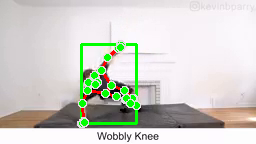

FALLING DETECTED!
centroid drop:  1.5718947649002075
fall frames:  12
fall threshold:  10
box width:  55.000831604003906
box height:  78.41865921020508


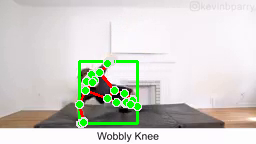

FALLING DETECTED!
centroid drop:  8.046583592891693
fall frames:  13
fall threshold:  10
box width:  57.23558807373047
box height:  62.10010814666748


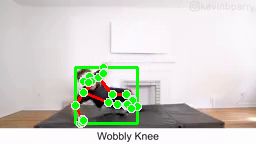

FALL DETECTED!!
centroid drop:  3.300297737121582
fall frames:  14
fall threshold:  10
box width:  62.35614013671875
box height:  55.40840435028076


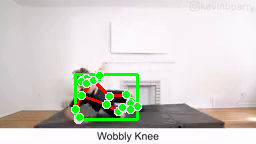

FALL DETECTED!!
centroid drop:  5.2162580490112305
fall frames:  15
fall threshold:  10
box width:  61.70270538330078
box height:  44.87992286682129


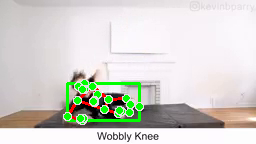

FALL DETECTED!!
centroid drop:  4.0172582268714905
fall frames:  16
fall threshold:  10
box width:  71.40032196044922
box height:  36.71538162231445


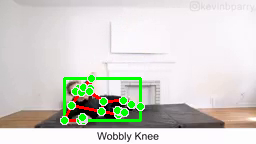

FALL DETECTED!!
centroid drop:  -2.7299924492836
fall frames:  16
fall threshold:  10
box width:  75.83192443847656
box height:  42.25040531158447


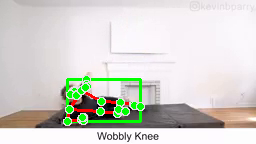

FALL DETECTED!!
centroid drop:  0.08519232273101807
fall frames:  16
fall threshold:  10
box width:  73.33330535888672
box height:  42.06870174407959


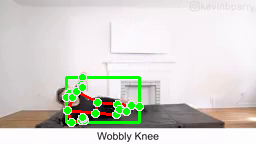

FALL DETECTED!!
centroid drop:  -1.520951747894287
fall frames:  16
fall threshold:  10
box width:  72.90507507324219
box height:  45.13684844970703


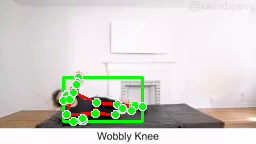

FALL DETECTED!!
centroid drop:  0.4149233102798462
fall frames:  17
fall threshold:  10
box width:  79.04610824584961
box height:  44.31101131439209


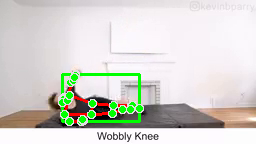

FALL DETECTED!!
centroid drop:  -1.2361480593681335
fall frames:  17
fall threshold:  10
box width:  77.63628768920898
box height:  46.81756782531738


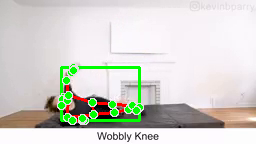

FALL DETECTED!!
centroid drop:  -3.209730416536331
fall frames:  17
fall threshold:  10
box width:  78.20759201049805
box height:  53.33571767807007


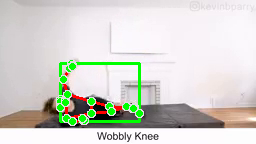

FALL DETECTED!!
centroid drop:  -2.0360482335090637
fall frames:  17
fall threshold:  10
box width:  79.32282638549805
box height:  57.46092939376831


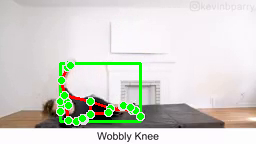

FALL DETECTED!!
centroid drop:  -0.4201928973197937
fall frames:  17
fall threshold:  10
box width:  79.48787307739258
box height:  58.3076491355896


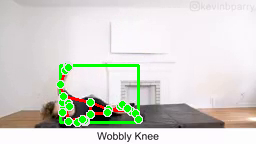

FALL DETECTED!!
centroid drop:  0.7111770808696747
fall frames:  18
fall threshold:  10
box width:  77.4732666015625
box height:  56.85127830505371


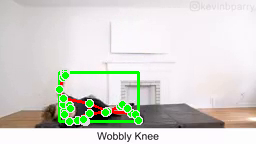

FALL DETECTED!!
centroid drop:  4.0884886384010315
fall frames:  19
fall threshold:  10
box width:  78.84257125854492
box height:  48.576581954956055


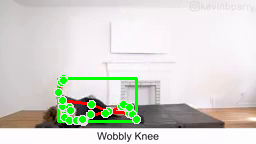

FALL DETECTED!!
centroid drop:  2.8082014322280884
fall frames:  20
fall threshold:  10
box width:  78.05512619018555
box height:  42.88252258300781


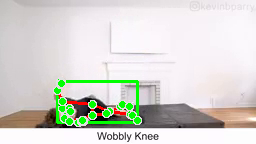

FALL DETECTED!!
centroid drop:  1.17119961977005
fall frames:  21
fall threshold:  10
box width:  80.25398635864258
box height:  40.493897438049316


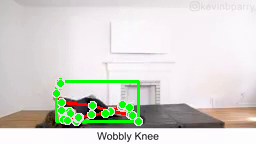

FALL DETECTED!!
centroid drop:  0.15401101112365723
fall frames:  21
fall threshold:  10
box width:  82.04683685302734
box height:  40.190752029418945


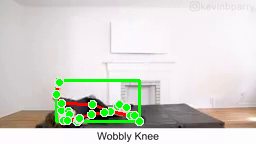

FALL DETECTED!!
centroid drop:  -0.3782895803451538
fall frames:  21
fall threshold:  10
box width:  83.77256393432617
box height:  40.961073875427246


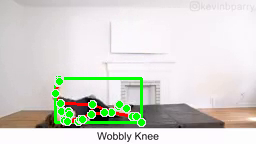

FALL DETECTED!!
centroid drop:  -1.2878599762916565
fall frames:  21
fall threshold:  10
box width:  85.37854766845703
box height:  43.55866241455078


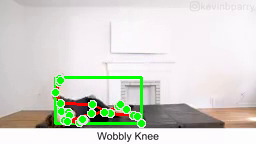

FALL DETECTED!!
centroid drop:  -1.0728120803833008
fall frames:  21
fall threshold:  10
box width:  85.34955596923828
box height:  45.722411155700684


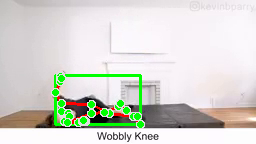

FALL DETECTED!!
centroid drop:  -1.7422291040420532
fall frames:  21
fall threshold:  10
box width:  84.56403350830078
box height:  49.23270606994629


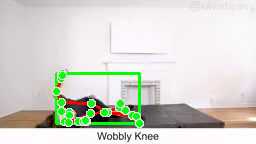

FALL DETECTED!!
centroid drop:  -0.407878041267395
fall frames:  21
fall threshold:  10
box width:  83.96981048583984
box height:  50.0837345123291


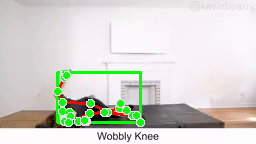

FALL DETECTED!!
centroid drop:  -0.11778020858764648
fall frames:  21
fall threshold:  10
box width:  82.94172286987305
box height:  50.32969093322754


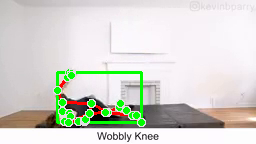

FALL DETECTED!!
centroid drop:  0.14393270015716553
fall frames:  21
fall threshold:  10
box width:  83.37637329101562
box height:  50.033995628356934


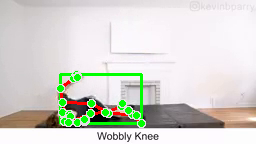

FALL DETECTED!!
centroid drop:  0.6553348302841187
fall frames:  22
fall threshold:  10
box width:  80.74058532714844
box height:  48.703834533691406


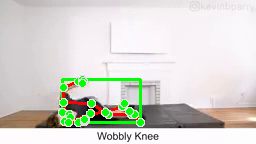

FALL DETECTED!!
centroid drop:  2.7008751034736633
fall frames:  23
fall threshold:  10
box width:  77.73087310791016
box height:  43.23058319091797


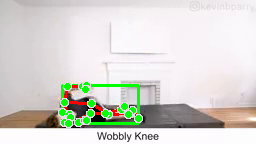

FALL DETECTED!!
centroid drop:  2.7995898127555847
fall frames:  24
fall threshold:  10
box width:  76.05609130859375
box height:  37.54424858093262


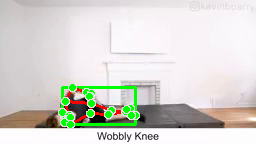

FALL DETECTED!!
centroid drop:  0.24120664596557617
fall frames:  24
fall threshold:  10
box width:  73.56399917602539
box height:  37.04369258880615


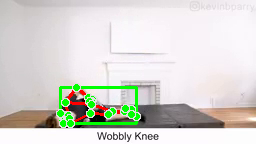

FALL DETECTED!!
centroid drop:  0.16462433338165283
fall frames:  24
fall threshold:  10
box width:  75.72843170166016
box height:  36.713690757751465


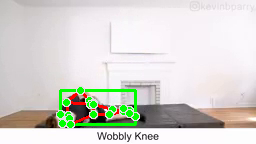

FALL DETECTED!!
centroid drop:  1.5276153683662415
fall frames:  25
fall threshold:  10
box width:  75.63401794433594
box height:  33.61059379577637


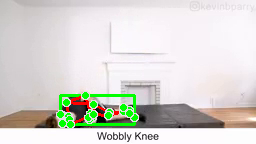

FALL DETECTED!!
centroid drop:  2.1509636640548706
fall frames:  26
fall threshold:  10
box width:  74.8009033203125
box height:  29.245914459228516


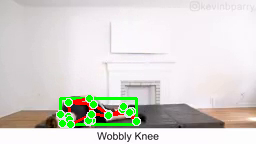

FALL DETECTED!!
centroid drop:  1.685037910938263
fall frames:  27
fall threshold:  10
box width:  76.4493293762207
box height:  25.829792976379395


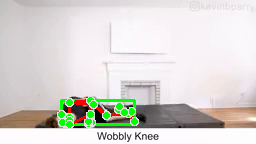

FALL DETECTED!!
centroid drop:  0.8604337573051453
fall frames:  28
fall threshold:  10
box width:  73.37808990478516
box height:  24.086966514587402


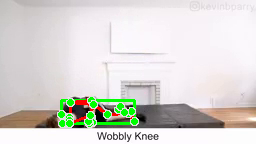

FALL DETECTED!!
centroid drop:  0.5811949372291565
fall frames:  29
fall threshold:  10
box width:  72.96792602539062
box height:  22.917325973510742


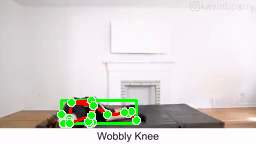

FALL DETECTED!!
centroid drop:  -0.39408349990844727
fall frames:  29
fall threshold:  10
box width:  74.03840255737305
box height:  23.709800720214844


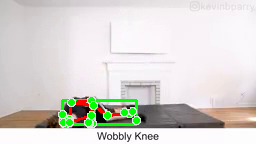

FALL DETECTED!!
centroid drop:  0.16984212398529053
fall frames:  29
fall threshold:  10
box width:  73.99200820922852
box height:  23.363405227661133


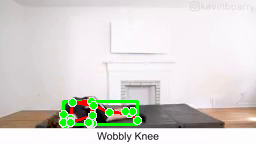

FALL DETECTED!!
centroid drop:  0.3912367820739746
fall frames:  30
fall threshold:  10
box width:  74.58462142944336
box height:  22.568527221679688


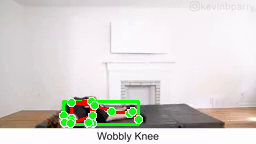

FALL DETECTED!!
centroid drop:  -0.11172223091125488
fall frames:  30
fall threshold:  10
box width:  74.80789566040039
box height:  22.79245090484619


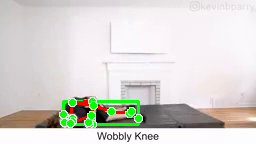

FALL DETECTED!!
centroid drop:  0.11137771606445312
fall frames:  30
fall threshold:  10
box width:  74.3425521850586
box height:  22.565832138061523


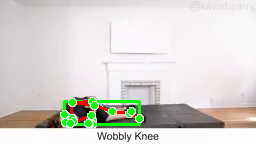

FALL DETECTED!!
centroid drop:  -0.032316386699676514
fall frames:  30
fall threshold:  10
box width:  74.09394073486328
box height:  22.629295349121094


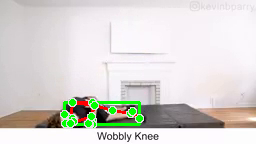

FALL DETECTED!!
centroid drop:  0.33433908224105835
fall frames:  31
fall threshold:  10
box width:  74.53717041015625
box height:  21.951224327087402


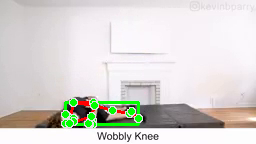

FALL DETECTED!!
centroid drop:  0.13048356771469116
fall frames:  31
fall threshold:  10
box width:  72.75796508789062
box height:  21.691165924072266


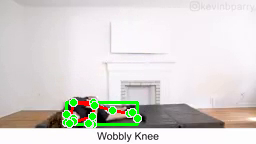

FALL DETECTED!!
centroid drop:  -0.16473615169525146
fall frames:  31
fall threshold:  10
box width:  71.7403564453125
box height:  22.022918701171875


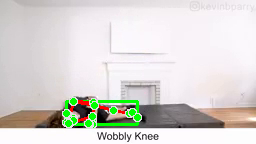

FALL DETECTED!!
centroid drop:  -0.404802143573761
fall frames:  31
fall threshold:  10
box width:  70.99215698242188
box height:  22.83958911895752


In [ ]:
detect_mp4(Falling_path)

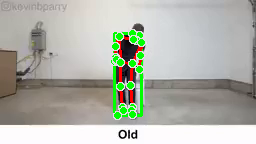

no fall detected
centroid drop:  0
fall frames:  0
fall threshold:  10
box width:  26.34972381591797
box height:  82.23429036140442


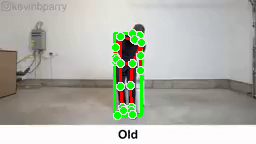

no fall detected
centroid drop:  0.19908811151981354
fall frames:  0
fall threshold:  10
box width:  26.425865173339844
box height:  81.83052778244019


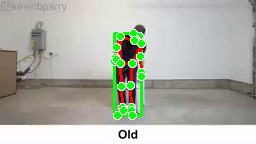

no fall detected
centroid drop:  0.2521292716264725
fall frames:  0
fall threshold:  10
box width:  27.598159790039062
box height:  81.31944251060486


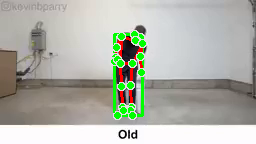

no fall detected
centroid drop:  0.15146830677986145
fall frames:  0
fall threshold:  10
box width:  27.788841247558594
box height:  81.01227593421936


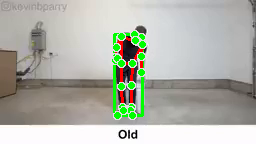

no fall detected
centroid drop:  0.11410661041736603
fall frames:  0
fall threshold:  10
box width:  27.49365997314453
box height:  80.78100728988647


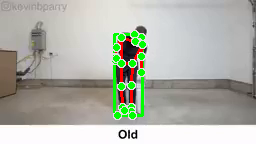

no fall detected
centroid drop:  0.20409640669822693
fall frames:  0
fall threshold:  10
box width:  27.60247802734375
box height:  80.36724758148193


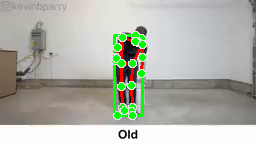

no fall detected
centroid drop:  0.12798213958740234
fall frames:  0
fall threshold:  10
box width:  27.72785186767578
box height:  80.10766124725342


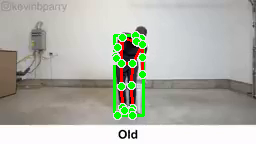

no fall detected
centroid drop:  0.09870399534702301
fall frames:  0
fall threshold:  10
box width:  28.194313049316406
box height:  79.90701699256897


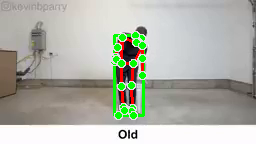

no fall detected
centroid drop:  0.014298051595687866
fall frames:  0
fall threshold:  10
box width:  28.722808837890625
box height:  79.8769462108612


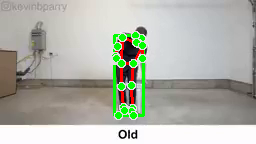

no fall detected
centroid drop:  0.07169929146766663
fall frames:  0
fall threshold:  10
box width:  28.905235290527344
box height:  79.73110699653625


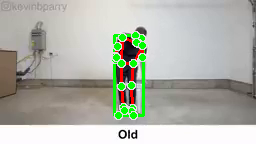

no fall detected
centroid drop:  0.013109773397445679
fall frames:  0
fall threshold:  10
box width:  28.87732696533203
box height:  79.70456385612488


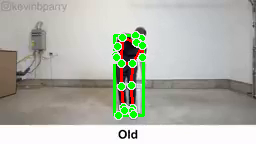

no fall detected
centroid drop:  0.005141705274581909
fall frames:  0
fall threshold:  10
box width:  28.656883239746094
box height:  79.69422554969788


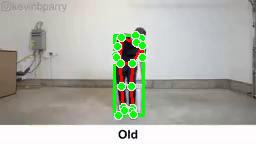

no fall detected
centroid drop:  0.060949504375457764
fall frames:  0
fall threshold:  10
box width:  28.393295288085938
box height:  79.57061219215393


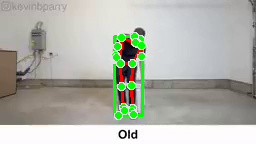

no fall detected
centroid drop:  0.10490669310092926
fall frames:  0
fall threshold:  10
box width:  27.264968872070312
box height:  79.35784864425659


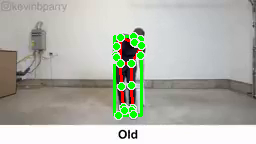

no fall detected
centroid drop:  0.044365108013153076
fall frames:  0
fall threshold:  10
box width:  26.59881591796875
box height:  79.2678894996643


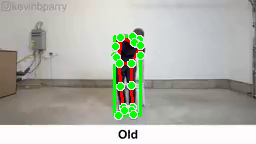

no fall detected
centroid drop:  0.18875446915626526
fall frames:  0
fall threshold:  10
box width:  26.102737426757812
box height:  78.88536357879639


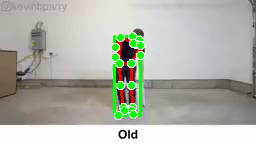

no fall detected
centroid drop:  0.18787357211112976
fall frames:  0
fall threshold:  10
box width:  26.220848083496094
box height:  78.5047173500061


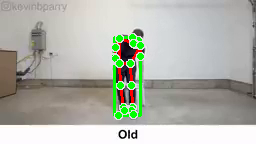

no fall detected
centroid drop:  0.21229788661003113
fall frames:  0
fall threshold:  10
box width:  26.580307006835938
box height:  78.07470989227295


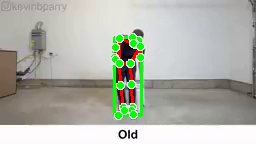

no fall detected
centroid drop:  0.08931615948677063
fall frames:  0
fall threshold:  10
box width:  27.177276611328125
box height:  77.89318227767944


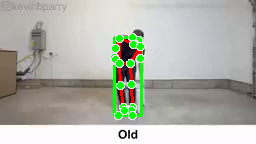

no fall detected
centroid drop:  0.14204198122024536
fall frames:  0
fall threshold:  10
box width:  27.75855255126953
box height:  77.60540914535522


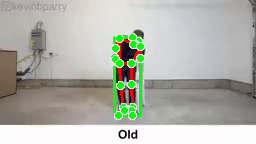

no fall detected
centroid drop:  0.11645123362541199
fall frames:  0
fall threshold:  10
box width:  26.65747833251953
box height:  77.36895847320557


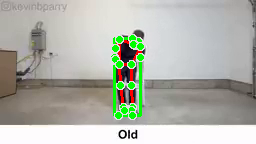

no fall detected
centroid drop:  0.05134645104408264
fall frames:  0
fall threshold:  10
box width:  26.669593811035156
box height:  77.26410341262817


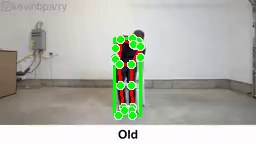

no fall detected
centroid drop:  0.07166770100593567
fall frames:  0
fall threshold:  10
box width:  26.390335083007812
box height:  77.11841011047363


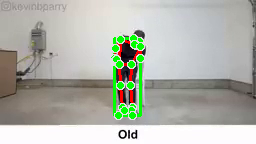

no fall detected
centroid drop:  0.029063016176223755
fall frames:  0
fall threshold:  10
box width:  26.08788299560547
box height:  77.05970621109009


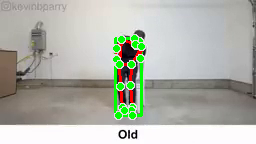

no fall detected
centroid drop:  -0.11799675226211548
fall frames:  0
fall threshold:  10
box width:  26.25658416748047
box height:  77.29499387741089


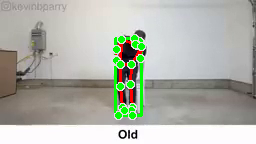

no fall detected
centroid drop:  -0.01907077431678772
fall frames:  0
fall threshold:  10
box width:  26.436988830566406
box height:  77.33167362213135


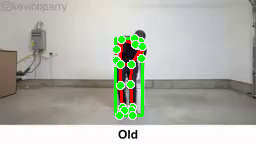

no fall detected
centroid drop:  0.15383535623550415
fall frames:  0
fall threshold:  10
box width:  26.444351196289062
box height:  77.02380752563477


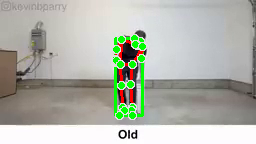

no fall detected
centroid drop:  0.2004212737083435
fall frames:  0
fall threshold:  10
box width:  26.41339874267578
box height:  76.61877250671387


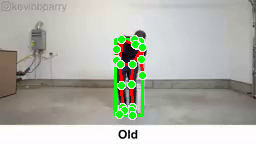

no fall detected
centroid drop:  0.19424140453338623
fall frames:  0
fall threshold:  10
box width:  26.330245971679688
box height:  76.22665500640869


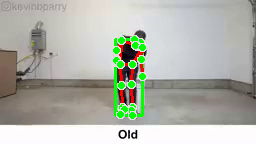

no fall detected
centroid drop:  0.13902929425239563
fall frames:  0
fall threshold:  10
box width:  26.59637451171875
box height:  75.94572687149048


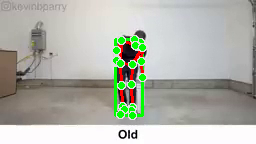

no fall detected
centroid drop:  -0.020245641469955444
fall frames:  0
fall threshold:  10
box width:  26.73357391357422
box height:  75.9860029220581


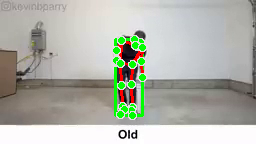

no fall detected
centroid drop:  -0.025108665227890015
fall frames:  0
fall threshold:  10
box width:  26.913772583007812
box height:  76.03647565841675


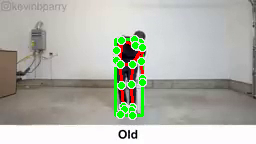

no fall detected
centroid drop:  0.0937829315662384
fall frames:  0
fall threshold:  10
box width:  27.151123046875
box height:  75.8461503982544


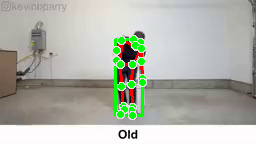

no fall detected
centroid drop:  0.0387706458568573
fall frames:  0
fall threshold:  10
box width:  27.496139526367188
box height:  75.76681280136108


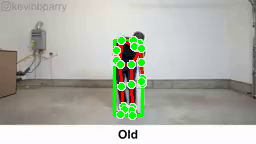

no fall detected
centroid drop:  0.318760484457016
fall frames:  1
fall threshold:  10
box width:  28.054840087890625
box height:  75.11955070495605


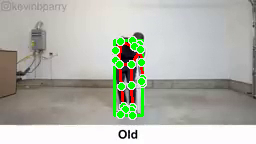

no fall detected
centroid drop:  0.2653428912162781
fall frames:  1
fall threshold:  10
box width:  28.171363830566406
box height:  74.58139228820801


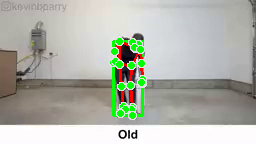

no fall detected
centroid drop:  0.38642269372940063
fall frames:  2
fall threshold:  10
box width:  28.884078979492188
box height:  73.79732894897461


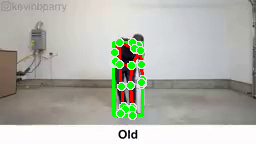

no fall detected
centroid drop:  0.31935325264930725
fall frames:  3
fall threshold:  10
box width:  28.701148986816406
box height:  73.14872789382935


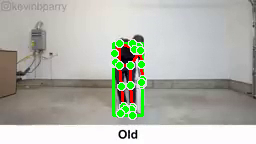

no fall detected
centroid drop:  0.34737563133239746
fall frames:  4
fall threshold:  10
box width:  28.70147705078125
box height:  72.44284772872925


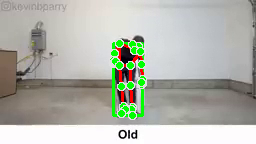

no fall detected
centroid drop:  0.03472226858139038
fall frames:  4
fall threshold:  10
box width:  28.80457305908203
box height:  72.3721833229065


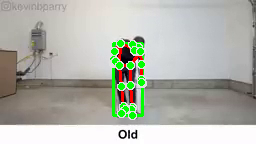

no fall detected
centroid drop:  -0.015138566493988037
fall frames:  4
fall threshold:  10
box width:  29.043800354003906
box height:  72.40311670303345


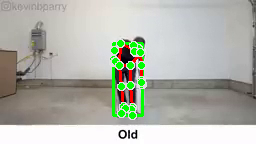

no fall detected
centroid drop:  0.25336727499961853
fall frames:  4
fall threshold:  10
box width:  28.927581787109375
box height:  71.89126968383789


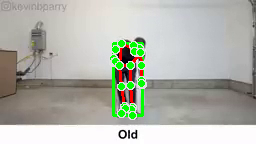

no fall detected
centroid drop:  0.13858240842819214
fall frames:  4
fall threshold:  10
box width:  28.860626220703125
box height:  71.61084365844727


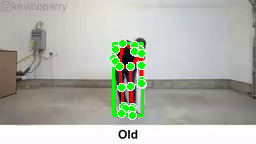

no fall detected
centroid drop:  0.042444199323654175
fall frames:  4
fall threshold:  10
box width:  28.837188720703125
box height:  71.52496576309204


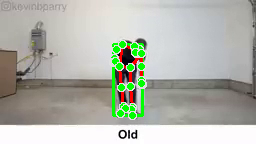

no fall detected
centroid drop:  0.22925135493278503
fall frames:  4
fall threshold:  10
box width:  28.795249938964844
box height:  71.0599479675293


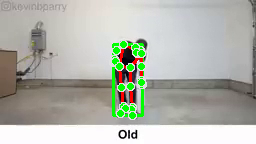

no fall detected
centroid drop:  0.20692908763885498
fall frames:  4
fall threshold:  10
box width:  28.477706909179688
box height:  70.6404504776001


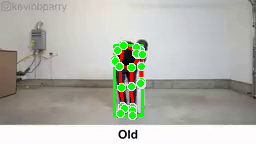

no fall detected
centroid drop:  0.24952033162117004
fall frames:  4
fall threshold:  10
box width:  28.074867248535156
box height:  70.13435411453247


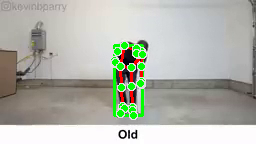

no fall detected
centroid drop:  0.34729960560798645
fall frames:  5
fall threshold:  10
box width:  28.387985229492188
box height:  69.43115615844727


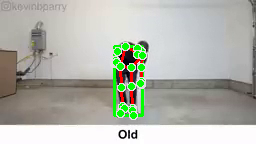

no fall detected
centroid drop:  0.10226178169250488
fall frames:  5
fall threshold:  10
box width:  28.39490509033203
box height:  69.2239179611206


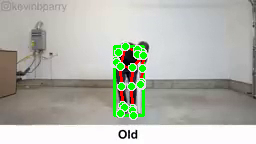

no fall detected
centroid drop:  0.24299803376197815
fall frames:  5
fall threshold:  10
box width:  28.36565399169922
box height:  68.73120260238647


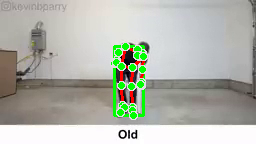

no fall detected
centroid drop:  0.14886775612831116
fall frames:  5
fall threshold:  10
box width:  28.180404663085938
box height:  68.42953777313232


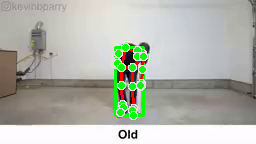

no fall detected
centroid drop:  0.035251617431640625
fall frames:  5
fall threshold:  10
box width:  28.040267944335938
box height:  68.35543155670166


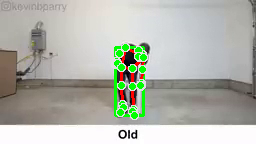

no fall detected
centroid drop:  0.11139929294586182
fall frames:  5
fall threshold:  10
box width:  28.178916931152344
box height:  68.1280746459961


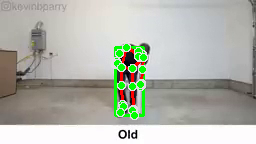

no fall detected
centroid drop:  0.2661144435405731
fall frames:  5
fall threshold:  10
box width:  28.191993713378906
box height:  67.5878176689148


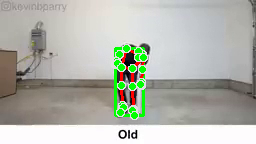

no fall detected
centroid drop:  0.046918630599975586
fall frames:  5
fall threshold:  10
box width:  28.16600799560547
box height:  67.48898363113403


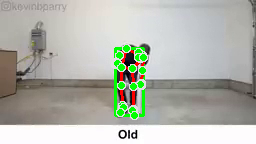

no fall detected
centroid drop:  0.09067469835281372
fall frames:  5
fall threshold:  10
box width:  28.43578338623047
box height:  67.30497980117798


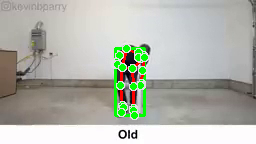

no fall detected
centroid drop:  0.05700215697288513
fall frames:  5
fall threshold:  10
box width:  28.62364959716797
box height:  67.1894645690918


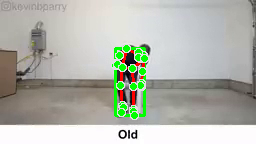

no fall detected
centroid drop:  0.0967119038105011
fall frames:  5
fall threshold:  10
box width:  28.717750549316406
box height:  66.9936032295227


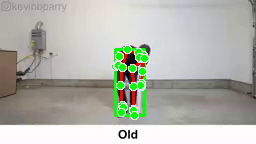

no fall detected
centroid drop:  0.19314396381378174
fall frames:  5
fall threshold:  10
box width:  28.471336364746094
box height:  66.60190629959106


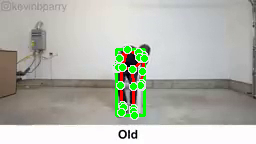

no fall detected
centroid drop:  0.3008892834186554
fall frames:  6
fall threshold:  10
box width:  28.42601776123047
box height:  65.99470138549805


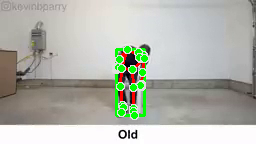

no fall detected
centroid drop:  0.1315808892250061
fall frames:  6
fall threshold:  10
box width:  28.745460510253906
box height:  65.72833442687988


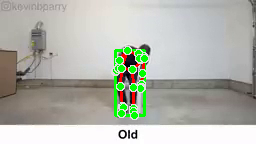

no fall detected
centroid drop:  0.18708395957946777
fall frames:  6
fall threshold:  10
box width:  28.90680694580078
box height:  65.34885120391846


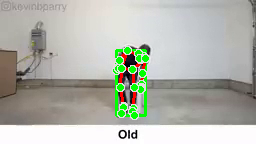

no fall detected
centroid drop:  0.103342205286026
fall frames:  6
fall threshold:  10
box width:  28.919662475585938
box height:  65.13935136795044


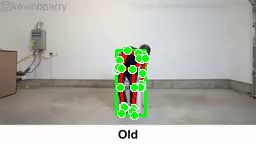

no fall detected
centroid drop:  0.07356873154640198
fall frames:  6
fall threshold:  10
box width:  29.062278747558594
box height:  64.99033641815186


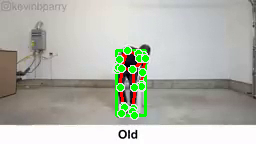

no fall detected
centroid drop:  0.05412024259567261
fall frames:  6
fall threshold:  10
box width:  29.07733154296875
box height:  64.88036155700684


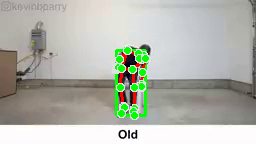

no fall detected
centroid drop:  -0.0018665492534637451
fall frames:  6
fall threshold:  10
box width:  29.09288787841797
box height:  64.88493204116821


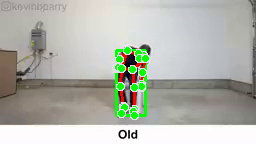

no fall detected
centroid drop:  -0.062123119831085205
fall frames:  6
fall threshold:  10
box width:  29.170921325683594
box height:  65.0100474357605


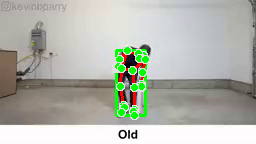

no fall detected
centroid drop:  0.000825047492980957
fall frames:  6
fall threshold:  10
box width:  29.11792755126953
box height:  65.0092921257019


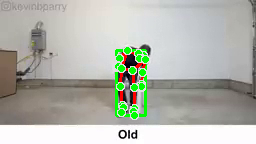

no fall detected
centroid drop:  0.008300840854644775
fall frames:  6
fall threshold:  10
box width:  29.166969299316406
box height:  64.9926495552063


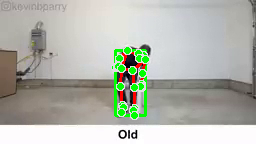

no fall detected
centroid drop:  0.016076087951660156
fall frames:  6
fall threshold:  10
box width:  29.525497436523438
box height:  64.96058320999146


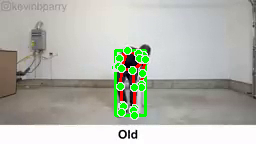

no fall detected
centroid drop:  0.13412198424339294
fall frames:  6
fall threshold:  10
box width:  29.58929443359375
box height:  64.6913194656372


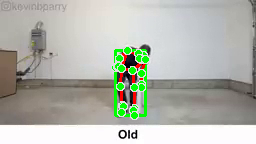

no fall detected
centroid drop:  0.04679286479949951
fall frames:  6
fall threshold:  10
box width:  29.572052001953125
box height:  64.59671688079834


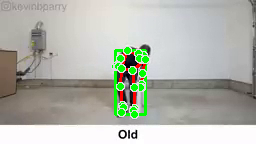

no fall detected
centroid drop:  0.19111725687980652
fall frames:  6
fall threshold:  10
box width:  29.500205993652344
box height:  64.21402788162231


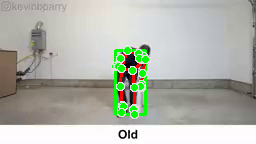

no fall detected
centroid drop:  0.04422491788864136
fall frames:  6
fall threshold:  10
box width:  29.476951599121094
box height:  64.12532186508179


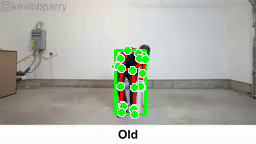

no fall detected
centroid drop:  0.17819902300834656
fall frames:  6
fall threshold:  10
box width:  29.432762145996094
box height:  63.767781257629395


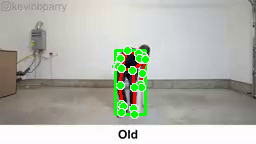

no fall detected
centroid drop:  0.008195817470550537
fall frames:  6
fall threshold:  10
box width:  29.43238067626953
box height:  63.75124168395996


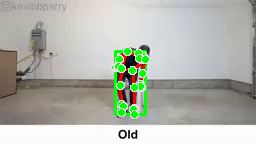

no fall detected
centroid drop:  0.18271052837371826
fall frames:  6
fall threshold:  10
box width:  29.370018005371094
box height:  63.38249588012695


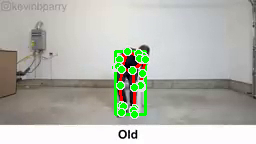

no fall detected
centroid drop:  0.21371257305145264
fall frames:  6
fall threshold:  10
box width:  29.360923767089844
box height:  62.95019245147705


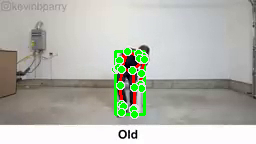

no fall detected
centroid drop:  0.19313517212867737
fall frames:  6
fall threshold:  10
box width:  29.243446350097656
box height:  62.559083461761475


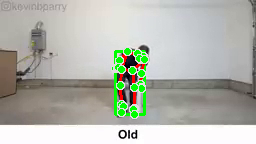

no fall detected
centroid drop:  0.05755418539047241
fall frames:  6
fall threshold:  10
box width:  29.267372131347656
box height:  62.44219923019409


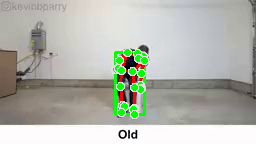

no fall detected
centroid drop:  0.048348426818847656
fall frames:  6
fall threshold:  10
box width:  29.197265625
box height:  62.34061861038208


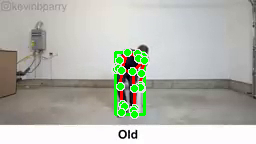

no fall detected
centroid drop:  -0.09855705499649048
fall frames:  6
fall threshold:  10
box width:  29.300392150878906
box height:  62.53815793991089


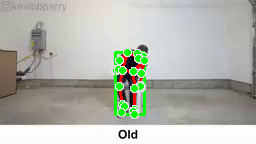

no fall detected
centroid drop:  -0.08718398213386536
fall frames:  6
fall threshold:  10
box width:  29.368423461914062
box height:  62.710896492004395


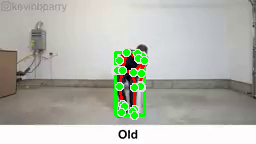

no fall detected
centroid drop:  0.17446300387382507
fall frames:  6
fall threshold:  10
box width:  29.299476623535156
box height:  62.35661745071411


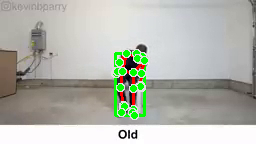

no fall detected
centroid drop:  -0.030610620975494385
fall frames:  6
fall threshold:  10
box width:  29.145828247070312
box height:  62.41148042678833


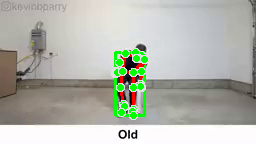

no fall detected
centroid drop:  -0.1835249364376068
fall frames:  6
fall threshold:  10
box width:  28.496856689453125
box height:  62.7843074798584


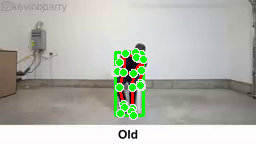

no fall detected
centroid drop:  -0.23266711831092834
fall frames:  6
fall threshold:  10
box width:  28.055328369140625
box height:  63.256346225738525


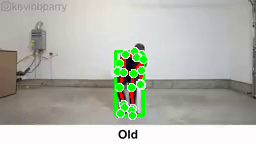

no fall detected
centroid drop:  -0.19990694522857666
fall frames:  6
fall threshold:  10
box width:  27.7449951171875
box height:  63.66142416000366


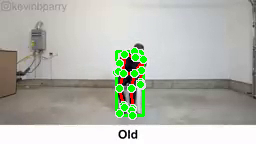

no fall detected
centroid drop:  -0.1913110315799713
fall frames:  6
fall threshold:  10
box width:  26.967628479003906
box height:  64.04429340362549


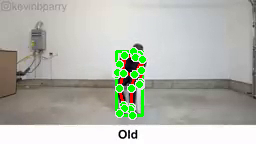

no fall detected
centroid drop:  0.054377853870391846
fall frames:  6
fall threshold:  10
box width:  26.734107971191406
box height:  63.93427562713623


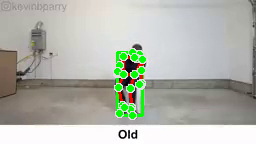

no fall detected
centroid drop:  0.10269773006439209
fall frames:  6
fall threshold:  10
box width:  25.299461364746094
box height:  63.72697734832764


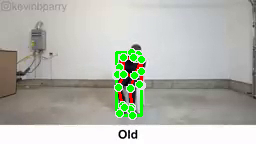

no fall detected
centroid drop:  0.21337580680847168
fall frames:  6
fall threshold:  10
box width:  25.685035705566406
box height:  63.296064376831055


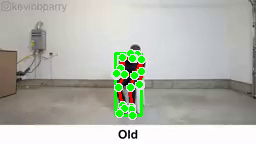

no fall detected
centroid drop:  0.17809081077575684
fall frames:  6
fall threshold:  10
box width:  25.861915588378906
box height:  62.93064022064209


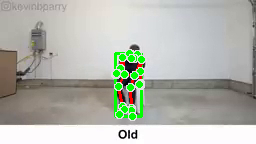

no fall detected
centroid drop:  -0.2655940353870392
fall frames:  6
fall threshold:  10
box width:  25.798973083496094
box height:  63.459086894989014


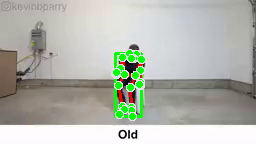

no fall detected
centroid drop:  0.07332026958465576
fall frames:  6
fall threshold:  10
box width:  25.738059997558594
box height:  63.31259107589722


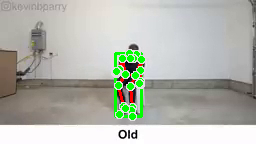

no fall detected
centroid drop:  0.07676258683204651
fall frames:  6
fall threshold:  10
box width:  25.324478149414062
box height:  63.15934467315674


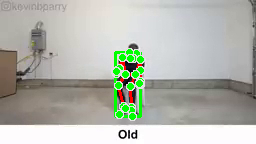

no fall detected
centroid drop:  -0.08735787868499756
fall frames:  6
fall threshold:  10
box width:  25.19196319580078
box height:  63.33946895599365


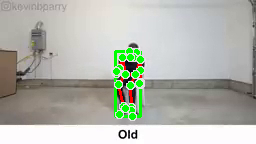

no fall detected
centroid drop:  -0.4288221597671509
fall frames:  6
fall threshold:  10
box width:  25.010704040527344
box height:  64.20901107788086


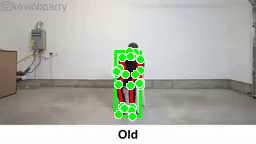

no fall detected
centroid drop:  -0.26283323764801025
fall frames:  6
fall threshold:  10
box width:  24.99846649169922
box height:  64.7429895401001


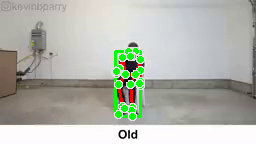

no fall detected
centroid drop:  -0.10036319494247437
fall frames:  6
fall threshold:  10
box width:  25.008773803710938
box height:  64.94774723052979


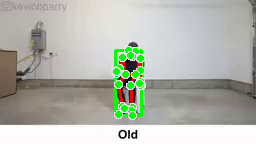

no fall detected
centroid drop:  -0.1227179765701294
fall frames:  6
fall threshold:  10
box width:  25.04212188720703
box height:  65.19684505462646


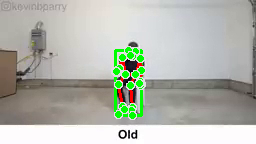

no fall detected
centroid drop:  -0.003737807273864746
fall frames:  6
fall threshold:  10
box width:  25.249542236328125
box height:  65.20463848114014


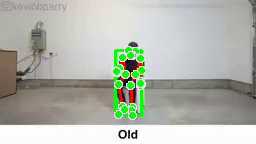

no fall detected
centroid drop:  -0.08564737439155579
fall frames:  6
fall threshold:  10
box width:  25.38005828857422
box height:  65.37838125228882


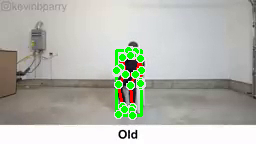

no fall detected
centroid drop:  -0.08456218242645264
fall frames:  6
fall threshold:  10
box width:  25.317543029785156
box height:  65.55012845993042


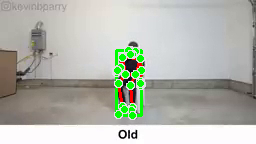

no fall detected
centroid drop:  -0.09130147099494934
fall frames:  6
fall threshold:  10
box width:  25.20067596435547
box height:  65.73538970947266


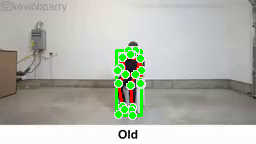

no fall detected
centroid drop:  -0.06018942594528198
fall frames:  6
fall threshold:  10
box width:  25.21563720703125
box height:  65.85753536224365


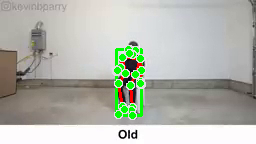

no fall detected
centroid drop:  -0.14998427033424377
fall frames:  6
fall threshold:  10
box width:  25.025901794433594
box height:  66.16182661056519


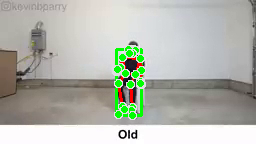

no fall detected
centroid drop:  -0.1417822539806366
fall frames:  6
fall threshold:  10
box width:  24.933006286621094
box height:  66.44937229156494


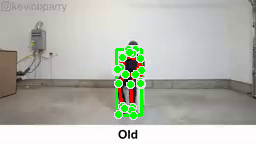

no fall detected
centroid drop:  -0.14991545677185059
fall frames:  6
fall threshold:  10
box width:  24.722389221191406
box height:  66.75347900390625


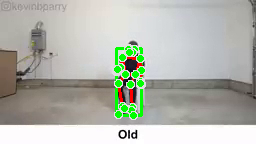

no fall detected
centroid drop:  -0.10966706275939941
fall frames:  6
fall threshold:  10
box width:  24.703521728515625
box height:  66.97591781616211


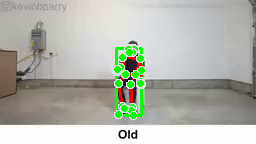

no fall detected
centroid drop:  -0.09287041425704956
fall frames:  6
fall threshold:  10
box width:  25.024063110351562
box height:  67.16423034667969


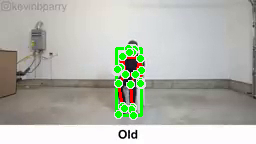

no fall detected
centroid drop:  -0.1451980471611023
fall frames:  6
fall threshold:  10
box width:  25.05779266357422
box height:  67.45858669281006


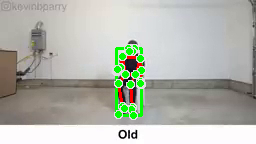

no fall detected
centroid drop:  -0.15869632363319397
fall frames:  6
fall threshold:  10
box width:  25.17547607421875
box height:  67.78045606613159


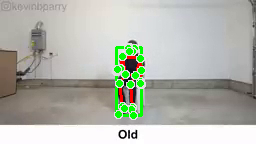

no fall detected
centroid drop:  -0.14291539788246155
fall frames:  6
fall threshold:  10
box width:  25.14446258544922
box height:  68.0703535079956


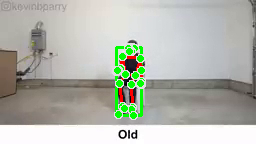

no fall detected
centroid drop:  -0.04661327600479126
fall frames:  6
fall threshold:  10
box width:  24.85938262939453
box height:  68.1648530960083


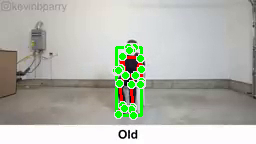

no fall detected
centroid drop:  -0.36753323674201965
fall frames:  6
fall threshold:  10
box width:  24.975616455078125
box height:  68.91063165664673


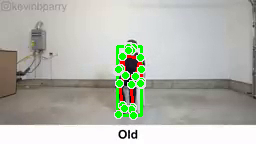

no fall detected
centroid drop:  -0.028137266635894775
fall frames:  6
fall threshold:  10
box width:  24.480430603027344
box height:  68.9680609703064


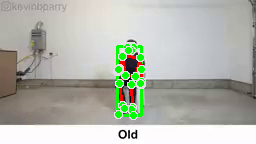

no fall detected
centroid drop:  -0.0709775984287262
fall frames:  6
fall threshold:  10
box width:  24.15887451171875
box height:  69.11384010314941


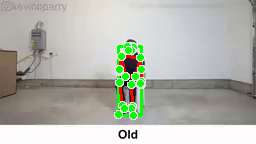

no fall detected
centroid drop:  0.030569493770599365
fall frames:  6
fall threshold:  10
box width:  23.682891845703125
box height:  69.057861328125


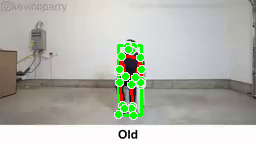

no fall detected
centroid drop:  -0.14892572164535522
fall frames:  6
fall threshold:  10
box width:  23.33379364013672
box height:  69.36006259918213


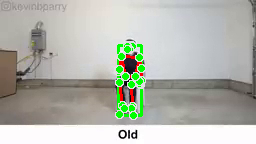

no fall detected
centroid drop:  -0.10252922773361206
fall frames:  6
fall threshold:  10
box width:  23.434486389160156
box height:  69.56827068328857


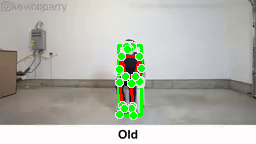

no fall detected
centroid drop:  6.130337715148926e-05
fall frames:  6
fall threshold:  10
box width:  23.33251190185547
box height:  69.56880712509155


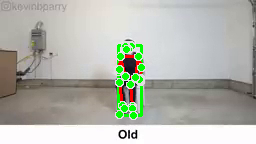

no fall detected
centroid drop:  -0.005905091762542725
fall frames:  6
fall threshold:  10
box width:  23.211212158203125
box height:  69.58064317703247


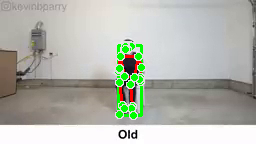

no fall detected
centroid drop:  0.039524585008621216
fall frames:  6
fall threshold:  10
box width:  22.97473907470703
box height:  69.49964904785156


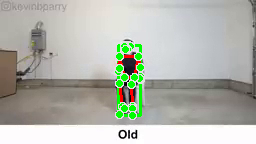

no fall detected
centroid drop:  0.043553948402404785
fall frames:  6
fall threshold:  10
box width:  22.59178924560547
box height:  69.41120910644531


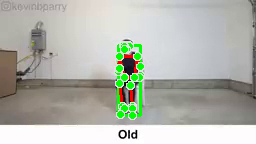

no fall detected
centroid drop:  0.014470934867858887
fall frames:  6
fall threshold:  10
box width:  22.56037139892578
box height:  69.3823184967041


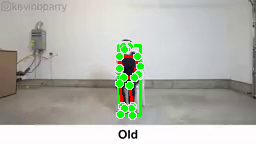

no fall detected
centroid drop:  0.0949629545211792
fall frames:  6
fall threshold:  10
box width:  21.96613311767578
box height:  69.19167137145996


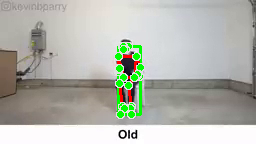

no fall detected
centroid drop:  0.1289559304714203
fall frames:  6
fall threshold:  10
box width:  22.04039764404297
box height:  68.933265209198


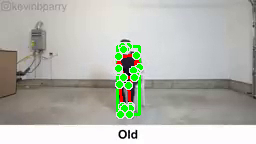

no fall detected
centroid drop:  0.09929975867271423
fall frames:  6
fall threshold:  10
box width:  22.08385467529297
box height:  68.73431396484375


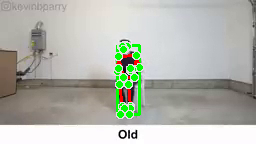

no fall detected
centroid drop:  -0.09337753057479858
fall frames:  6
fall threshold:  10
box width:  21.930259704589844
box height:  68.92301273345947


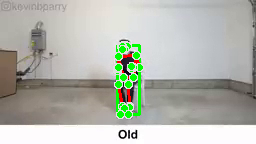

no fall detected
centroid drop:  -0.05381932854652405
fall frames:  6
fall threshold:  10
box width:  22.235816955566406
box height:  69.03168725967407


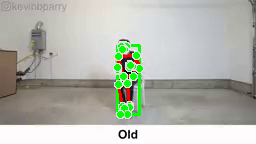

no fall detected
centroid drop:  -0.03117772936820984
fall frames:  6
fall threshold:  10
box width:  22.446426391601562
box height:  69.09966945648193


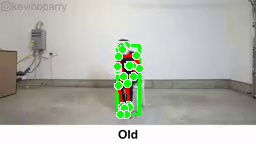

no fall detected
centroid drop:  0.024251669645309448
fall frames:  6
fall threshold:  10
box width:  22.337562561035156
box height:  69.05308485031128


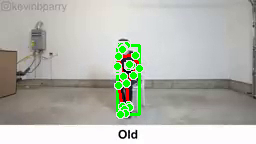

no fall detected
centroid drop:  -0.10582435131072998
fall frames:  6
fall threshold:  10
box width:  22.277687072753906
box height:  69.26785039901733


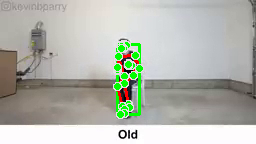

no fall detected
centroid drop:  0.05224767327308655
fall frames:  6
fall threshold:  10
box width:  22.133224487304688
box height:  69.16557884216309


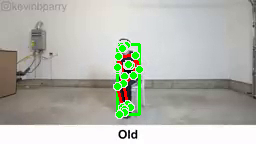

no fall detected
centroid drop:  -0.04075145721435547
fall frames:  6
fall threshold:  10
box width:  21.95417022705078
box height:  69.24850845336914


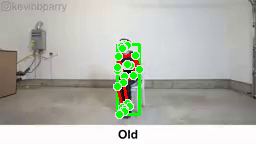

no fall detected
centroid drop:  0.05019441246986389
fall frames:  6
fall threshold:  10
box width:  21.91876983642578
box height:  69.14724969863892


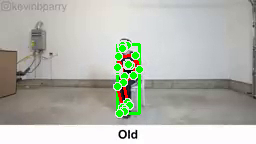

no fall detected
centroid drop:  0.008499354124069214
fall frames:  6
fall threshold:  10
box width:  21.93689727783203
box height:  69.13010501861572


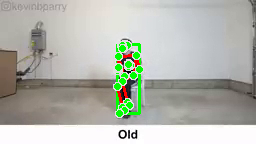

no fall detected
centroid drop:  0.0181257426738739
fall frames:  6
fall threshold:  10
box width:  21.918716430664062
box height:  69.0934681892395


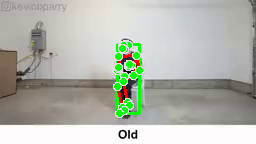

no fall detected
centroid drop:  0.0623355507850647
fall frames:  6
fall threshold:  10
box width:  21.683639526367188
box height:  68.96794939041138


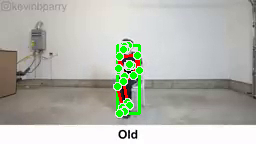

no fall detected
centroid drop:  0.10087338089942932
fall frames:  6
fall threshold:  10
box width:  21.71074676513672
box height:  68.76370239257812


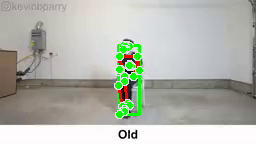

no fall detected
centroid drop:  -0.06566932797431946
fall frames:  6
fall threshold:  10
box width:  21.592811584472656
box height:  68.89495897293091


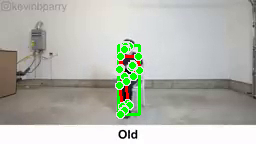

no fall detected
centroid drop:  0.054739177227020264
fall frames:  6
fall threshold:  10
box width:  21.31188201904297
box height:  68.78370523452759


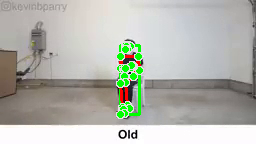

no fall detected
centroid drop:  -0.00774151086807251
fall frames:  6
fall threshold:  10
box width:  19.740943908691406
box height:  68.79943799972534


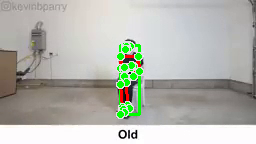

no fall detected
centroid drop:  0.003046691417694092
fall frames:  6
fall threshold:  10
box width:  19.69428253173828
box height:  68.79341268539429


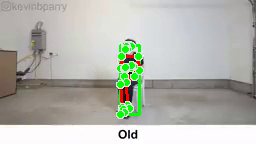

no fall detected
centroid drop:  -0.06980076432228088
fall frames:  6
fall threshold:  10
box width:  19.7392578125
box height:  68.93522644042969


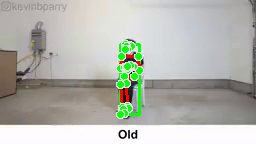

no fall detected
centroid drop:  -0.04915285110473633
fall frames:  6
fall threshold:  10
box width:  19.766624450683594
box height:  69.03491020202637


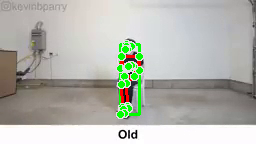

no fall detected
centroid drop:  -0.050992488861083984
fall frames:  6
fall threshold:  10
box width:  19.778907775878906
box height:  69.13835334777832


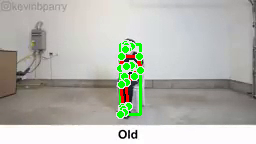

no fall detected
centroid drop:  -0.02569010853767395
fall frames:  6
fall threshold:  10
box width:  19.761322021484375
box height:  69.19041395187378


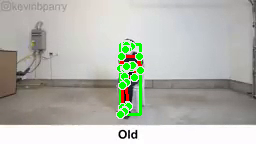

no fall detected
centroid drop:  -0.0582851767539978
fall frames:  6
fall threshold:  10
box width:  19.681991577148438
box height:  69.30852556228638


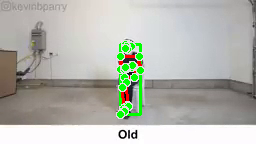

no fall detected
centroid drop:  -0.1994614601135254
fall frames:  6
fall threshold:  10
box width:  19.58300018310547
box height:  69.7074065208435


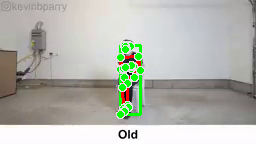

no fall detected
centroid drop:  0.32385650277137756
fall frames:  7
fall threshold:  10
box width:  19.580551147460938
box height:  69.05133819580078


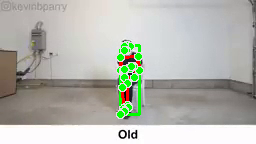

no fall detected
centroid drop:  0.32728636264801025
fall frames:  8
fall threshold:  10
box width:  19.542404174804688
box height:  68.38824462890625


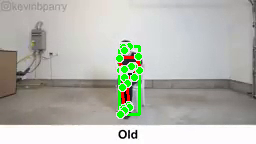

no fall detected
centroid drop:  0.06975209712982178
fall frames:  8
fall threshold:  10
box width:  19.970054626464844
box height:  68.24688148498535


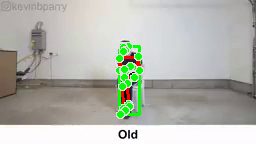

no fall detected
centroid drop:  0.04034474492073059
fall frames:  8
fall threshold:  10
box width:  20.306732177734375
box height:  68.1618275642395


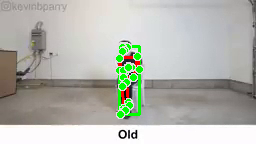

no fall detected
centroid drop:  0.05723834037780762
fall frames:  8
fall threshold:  10
box width:  20.624038696289062
box height:  68.04581880569458


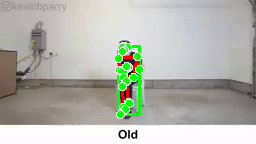

no fall detected
centroid drop:  0.06710907816886902
fall frames:  8
fall threshold:  10
box width:  20.998512268066406
box height:  67.91015911102295


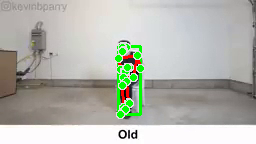

no fall detected
centroid drop:  0.03093564510345459
fall frames:  8
fall threshold:  10
box width:  21.106765747070312
box height:  67.84872150421143


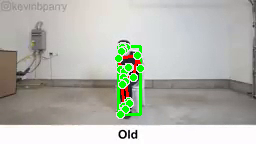

no fall detected
centroid drop:  0.0810212790966034
fall frames:  8
fall threshold:  10
box width:  21.34759521484375
box height:  67.68486642837524


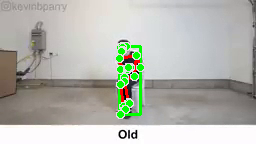

no fall detected
centroid drop:  -0.0031633973121643066
fall frames:  8
fall threshold:  10
box width:  21.784996032714844
box height:  67.69138097763062


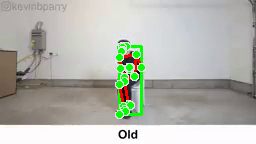

no fall detected
centroid drop:  0.09470409154891968
fall frames:  8
fall threshold:  10
box width:  21.994529724121094
box height:  67.5039439201355


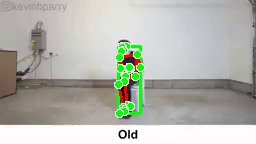

no fall detected
centroid drop:  0.12600886821746826
fall frames:  8
fall threshold:  10
box width:  22.095314025878906
box height:  67.2521595954895


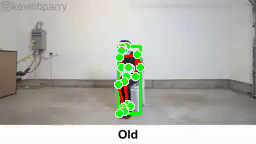

no fall detected
centroid drop:  -0.0048272013664245605
fall frames:  8
fall threshold:  10
box width:  22.3914794921875
box height:  67.2620644569397


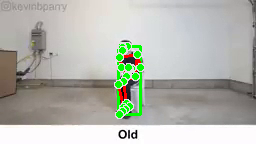

no fall detected
centroid drop:  -0.2607537806034088
fall frames:  8
fall threshold:  10
box width:  22.197158813476562
box height:  67.78621101379395


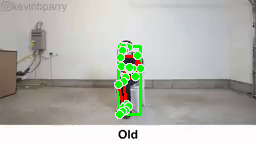

no fall detected
centroid drop:  -0.18938404321670532
fall frames:  8
fall threshold:  10
box width:  22.61774444580078
box height:  68.16350555419922


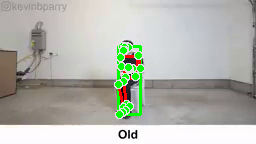

no fall detected
centroid drop:  -0.08828586339950562
fall frames:  8
fall threshold:  10
box width:  22.671463012695312
box height:  68.34015369415283


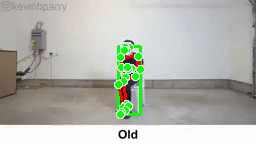

no fall detected
centroid drop:  -0.07108914852142334
fall frames:  8
fall threshold:  10
box width:  22.4256591796875
box height:  68.48313903808594


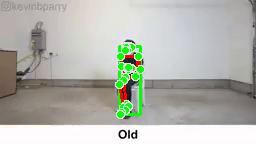

no fall detected
centroid drop:  -0.055203765630722046
fall frames:  8
fall threshold:  10
box width:  20.870162963867188
box height:  68.59539270401001


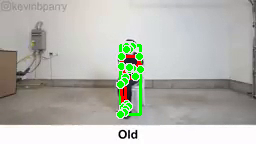

no fall detected
centroid drop:  -0.023493260145187378
fall frames:  8
fall threshold:  10
box width:  20.5699462890625
box height:  68.64909267425537


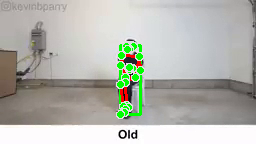

no fall detected
centroid drop:  -0.09546831250190735
fall frames:  8
fall threshold:  10
box width:  20.395118713378906
box height:  68.84340047836304


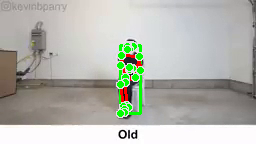

no fall detected
centroid drop:  0.2225908637046814
fall frames:  8
fall threshold:  10
box width:  20.326644897460938
box height:  68.3991322517395


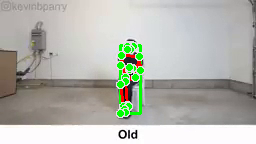

no fall detected
centroid drop:  -0.026484131813049316
fall frames:  8
fall threshold:  10
box width:  20.123008728027344
box height:  68.4527850151062


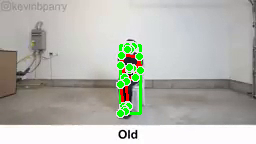

no fall detected
centroid drop:  -0.01745542883872986
fall frames:  8
fall threshold:  10
box width:  20.074485778808594
box height:  68.48797988891602


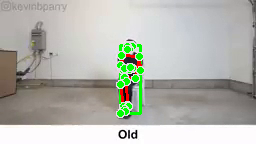

no fall detected
centroid drop:  0.07329803705215454
fall frames:  8
fall threshold:  10
box width:  20.155319213867188
box height:  68.3409948348999


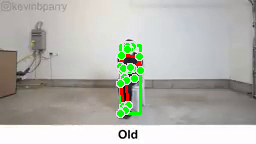

no fall detected
centroid drop:  0.03764200210571289
fall frames:  8
fall threshold:  10
box width:  20.391700744628906
box height:  68.26656246185303


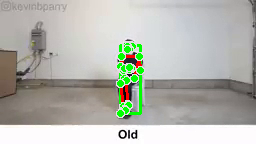

no fall detected
centroid drop:  -0.09252655506134033
fall frames:  8
fall threshold:  10
box width:  20.355392456054688
box height:  68.45212841033936


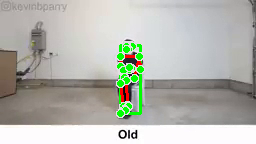

no fall detected
centroid drop:  -0.0022091567516326904
fall frames:  8
fall threshold:  10
box width:  20.3287353515625
box height:  68.45644998550415


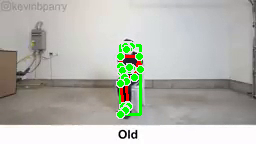

no fall detected
centroid drop:  -0.12424904108047485
fall frames:  8
fall threshold:  10
box width:  20.382545471191406
box height:  68.70466375350952


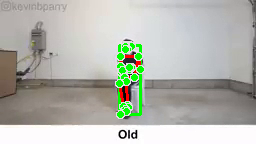

no fall detected
centroid drop:  0.0016719996929168701
fall frames:  8
fall threshold:  10
box width:  20.618576049804688
box height:  68.70127773284912


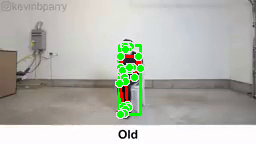

no fall detected
centroid drop:  0.005085259675979614
fall frames:  8
fall threshold:  10
box width:  20.87866973876953
box height:  68.69096517562866


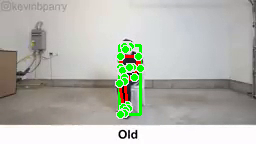

no fall detected
centroid drop:  -0.03933325409889221
fall frames:  8
fall threshold:  10
box width:  21.255081176757812
box height:  68.76968479156494


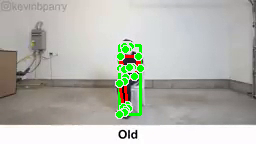

no fall detected
centroid drop:  0.002295941114425659
fall frames:  8
fall threshold:  10
box width:  21.773117065429688
box height:  68.76502847671509


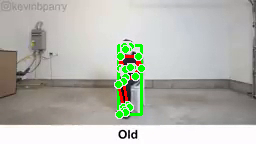

no fall detected
centroid drop:  0.03892973065376282
fall frames:  8
fall threshold:  10
box width:  22.163162231445312
box height:  68.68647193908691


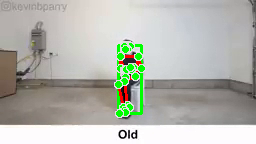

no fall detected
centroid drop:  0.04245239496231079
fall frames:  8
fall threshold:  10
box width:  22.11115264892578
box height:  68.60147380828857


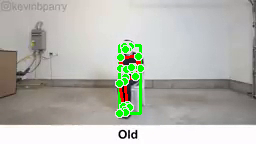

no fall detected
centroid drop:  0.2623760998249054
fall frames:  8
fall threshold:  10
box width:  21.853759765625
box height:  68.07591962814331


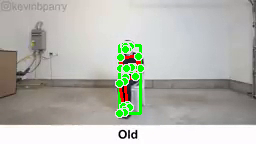

no fall detected
centroid drop:  0.08690914511680603
fall frames:  8
fall threshold:  10
box width:  21.679611206054688
box height:  67.89939594268799


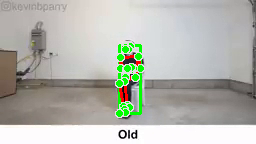

no fall detected
centroid drop:  0.308849573135376
fall frames:  9
fall threshold:  10
box width:  21.236427307128906
box height:  67.27777576446533


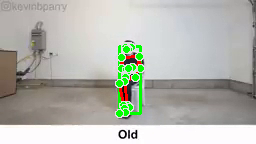

no fall detected
centroid drop:  0.15519189834594727
fall frames:  9
fall threshold:  10
box width:  21.05864715576172
box height:  66.96477699279785


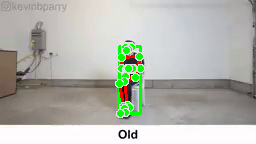

no fall detected
centroid drop:  0.05236256122589111
fall frames:  9
fall threshold:  10
box width:  21.011856079101562
box height:  66.85837268829346


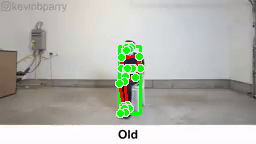

no fall detected
centroid drop:  0.0006424784660339355
fall frames:  9
fall threshold:  10
box width:  20.866043090820312
box height:  66.85669898986816


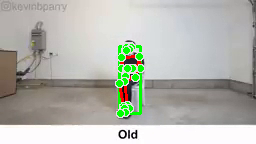

no fall detected
centroid drop:  -0.08414128422737122
fall frames:  9
fall threshold:  10
box width:  20.666824340820312
box height:  67.0247254371643


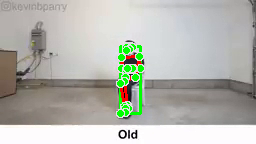

no fall detected
centroid drop:  -0.06372758746147156
fall frames:  9
fall threshold:  10
box width:  20.472763061523438
box height:  67.15202522277832


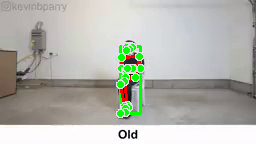

no fall detected
centroid drop:  -0.009369522333145142
fall frames:  9
fall threshold:  10
box width:  20.438636779785156
box height:  67.17086935043335


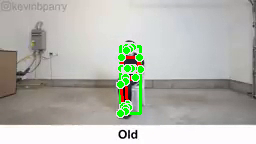

no fall detected
centroid drop:  0.008979976177215576
fall frames:  9
fall threshold:  10
box width:  20.420974731445312
box height:  67.15288782119751


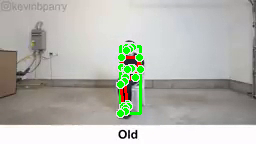

no fall detected
centroid drop:  -0.062043219804763794
fall frames:  9
fall threshold:  10
box width:  20.43090057373047
box height:  67.27672863006592


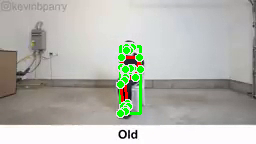

no fall detected
centroid drop:  -0.023319125175476074
fall frames:  9
fall threshold:  10
box width:  20.436180114746094
box height:  67.32272529602051


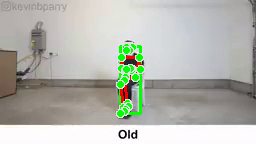

no fall detected
centroid drop:  0.05440977215766907
fall frames:  9
fall threshold:  10
box width:  20.54126739501953
box height:  67.21174192428589


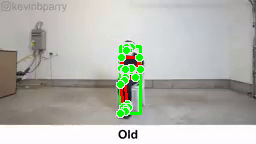

no fall detected
centroid drop:  -0.00020971894264221191
fall frames:  9
fall threshold:  10
box width:  20.551589965820312
box height:  67.21095657348633


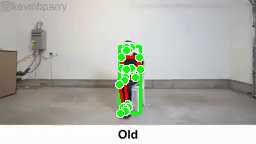

no fall detected
centroid drop:  0.061892300844192505
fall frames:  9
fall threshold:  10
box width:  20.583457946777344
box height:  67.08427476882935


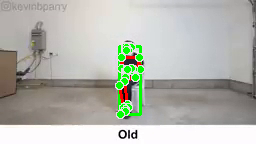

no fall detected
centroid drop:  -0.01929411292076111
fall frames:  9
fall threshold:  10
box width:  20.578636169433594
box height:  67.12178707122803


In [ ]:
detect_mp4(Sitting_path)

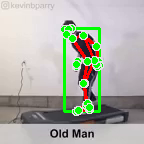

no fall detected
centroid drop:  0
fall frames:  0
fall threshold:  6
box width:  34.56490659713745
box height:  82.91210174560547


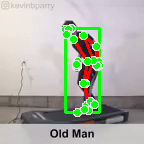

no fall detected
centroid drop:  -0.19350801408290863
fall frames:  0
fall threshold:  6
box width:  34.46342468261719
box height:  83.2991144657135


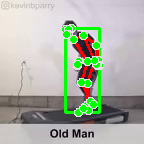

no fall detected
centroid drop:  0.07494691014289856
fall frames:  0
fall threshold:  6
box width:  34.16223621368408
box height:  83.14918112754822


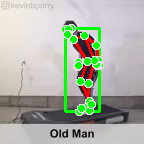

no fall detected
centroid drop:  0.1443561464548111
fall frames:  0
fall threshold:  6
box width:  33.875922203063965
box height:  82.86026859283447


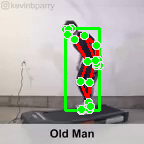

no fall detected
centroid drop:  0.3907168358564377
fall frames:  0
fall threshold:  6
box width:  33.42109680175781
box height:  82.07897543907166


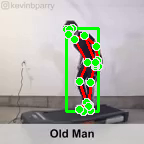

no fall detected
centroid drop:  -0.02362653613090515
fall frames:  0
fall threshold:  6
box width:  32.37783336639404
box height:  82.12622094154358


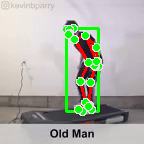

no fall detected
centroid drop:  -0.012841179966926575
fall frames:  0
fall threshold:  6
box width:  31.52841854095459
box height:  82.15207099914551


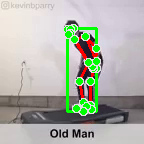

no fall detected
centroid drop:  -0.014622315764427185
fall frames:  0
fall threshold:  6
box width:  29.265462398529053
box height:  82.18125557899475


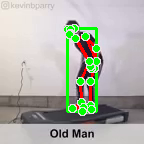

no fall detected
centroid drop:  -0.2565304934978485
fall frames:  0
fall threshold:  6
box width:  28.744289875030518
box height:  82.69429564476013


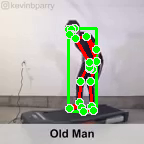

no fall detected
centroid drop:  -0.15263903141021729
fall frames:  0
fall threshold:  6
box width:  28.386672019958496
box height:  82.99962115287781


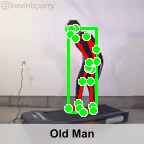

no fall detected
centroid drop:  -0.08338962495326996
fall frames:  0
fall threshold:  6
box width:  28.40548610687256
box height:  83.16660690307617


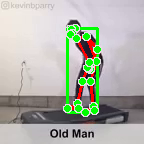

no fall detected
centroid drop:  -0.04004114866256714
fall frames:  0
fall threshold:  6
box width:  29.719614028930664
box height:  83.24679851531982


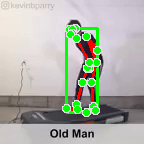

no fall detected
centroid drop:  -0.07954934239387512
fall frames:  0
fall threshold:  6
box width:  30.93783473968506
box height:  83.4060959815979


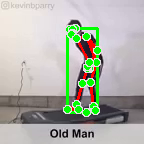

no fall detected
centroid drop:  0.011818662285804749
fall frames:  0
fall threshold:  6
box width:  30.482271194458008
box height:  83.38225436210632


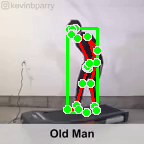

no fall detected
centroid drop:  0.02170124650001526
fall frames:  0
fall threshold:  6
box width:  29.755692958831787
box height:  83.33885407447815


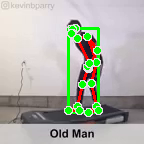

no fall detected
centroid drop:  -0.03391459584236145
fall frames:  0
fall threshold:  6
box width:  29.596386909484863
box height:  83.40763449668884


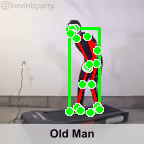

no fall detected
centroid drop:  -0.0230073481798172
fall frames:  0
fall threshold:  6
box width:  30.34026002883911
box height:  83.45629835128784


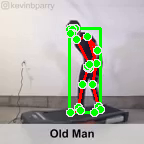

no fall detected
centroid drop:  -0.10845932364463806
fall frames:  0
fall threshold:  6
box width:  31.032299995422363
box height:  83.6728105545044


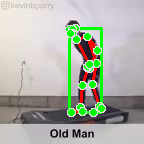

no fall detected
centroid drop:  -0.01053677499294281
fall frames:  0
fall threshold:  6
box width:  31.844211101531982
box height:  83.69287991523743


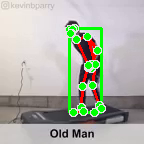

no fall detected
centroid drop:  0.01765468716621399
fall frames:  0
fall threshold:  6
box width:  32.798433780670166
box height:  83.65560793876648


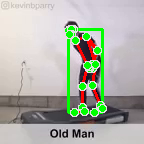

no fall detected
centroid drop:  0.2702392488718033
fall frames:  0
fall threshold:  6
box width:  34.16535186767578
box height:  83.1073579788208


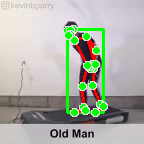

no fall detected
centroid drop:  0.22757308185100555
fall frames:  0
fall threshold:  6
box width:  36.12765169143677
box height:  82.64746642112732


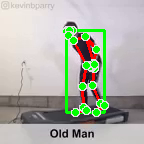

no fall detected
centroid drop:  0.19928200542926788
fall frames:  0
fall threshold:  6
box width:  37.84585762023926
box height:  82.24379825592041


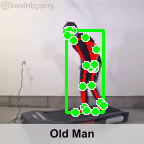

no fall detected
centroid drop:  0.17167812585830688
fall frames:  0
fall threshold:  6
box width:  37.444908142089844
box height:  81.89614963531494


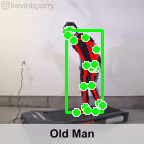

no fall detected
centroid drop:  0.03490254282951355
fall frames:  0
fall threshold:  6
box width:  36.88554096221924
box height:  81.82450246810913


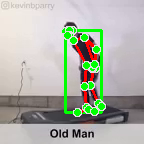

no fall detected
centroid drop:  0.02219441533088684
fall frames:  0
fall threshold:  6
box width:  35.499422550201416
box height:  81.78016662597656


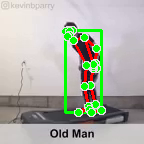

no fall detected
centroid drop:  -0.025457918643951416
fall frames:  0
fall threshold:  6
box width:  35.23438596725464
box height:  81.8311243057251


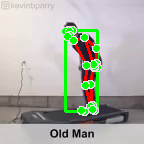

no fall detected
centroid drop:  0.6553787291049957
fall frames:  1
fall threshold:  6
box width:  31.12186861038208
box height:  80.52048540115356


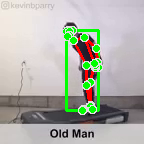

no fall detected
centroid drop:  0.41962914168834686
fall frames:  2
fall threshold:  6
box width:  32.10544967651367
box height:  79.68017506599426


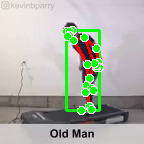

no fall detected
centroid drop:  0.0609026700258255
fall frames:  2
fall threshold:  6
box width:  33.26195812225342
box height:  79.5572247505188


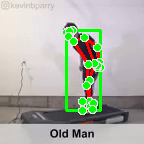

no fall detected
centroid drop:  0.18292397260665894
fall frames:  2
fall threshold:  6
box width:  33.96191596984863
box height:  79.18812704086304


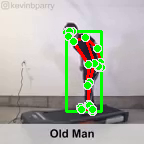

no fall detected
centroid drop:  -0.7137635201215744
fall frames:  2
fall threshold:  6
box width:  34.66833686828613
box height:  80.61459231376648


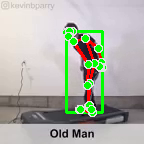

no fall detected
centroid drop:  -0.5513024628162384
fall frames:  2
fall threshold:  6
box width:  35.38115644454956
box height:  81.71576142311096


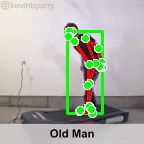

no fall detected
centroid drop:  -0.3553076982498169
fall frames:  2
fall threshold:  6
box width:  35.56920289993286
box height:  82.42597603797913


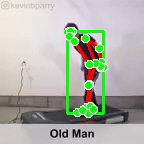

no fall detected
centroid drop:  -0.011498823761940002
fall frames:  2
fall threshold:  6
box width:  35.81037425994873
box height:  82.44828128814697


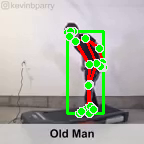

no fall detected
centroid drop:  0.11650045216083527
fall frames:  2
fall threshold:  6
box width:  36.0695013999939
box height:  82.21529603004456


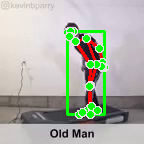

no fall detected
centroid drop:  -0.4505818039178848
fall frames:  2
fall threshold:  6
box width:  36.465322494506836
box height:  83.11655044555664


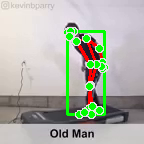

no fall detected
centroid drop:  -0.103769451379776
fall frames:  2
fall threshold:  6
box width:  36.542381286621094
box height:  83.32419633865356


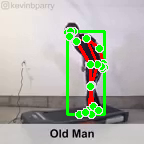

no fall detected
centroid drop:  -0.04502898454666138
fall frames:  2
fall threshold:  6
box width:  36.77699947357178
box height:  83.4143443107605


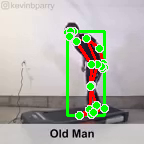

no fall detected
centroid drop:  -0.23121118545532227
fall frames:  2
fall threshold:  6
box width:  36.90692138671875
box height:  83.87683439254761


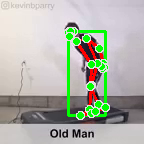

no fall detected
centroid drop:  -0.1197286993265152
fall frames:  2
fall threshold:  6
box width:  37.51625919342041
box height:  84.11635136604309


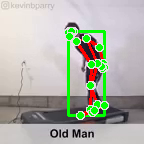

no fall detected
centroid drop:  0.07182185351848602
fall frames:  2
fall threshold:  6
box width:  36.84548807144165
box height:  83.97248840332031


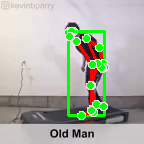

no fall detected
centroid drop:  0.041299521923065186
fall frames:  2
fall threshold:  6
box width:  36.616732120513916
box height:  83.88932704925537


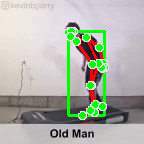

no fall detected
centroid drop:  0.0065692514181137085
fall frames:  2
fall threshold:  6
box width:  36.34639549255371
box height:  83.87608122825623


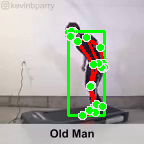

no fall detected
centroid drop:  -0.03647002577781677
fall frames:  2
fall threshold:  6
box width:  35.995768547058105
box height:  83.94825196266174


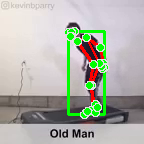

no fall detected
centroid drop:  0.13322678208351135
fall frames:  2
fall threshold:  6
box width:  35.699270725250244
box height:  83.68178629875183


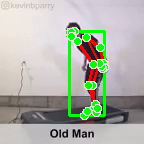

no fall detected
centroid drop:  -0.0694199949502945
fall frames:  2
fall threshold:  6
box width:  35.502280712127686
box height:  83.82052946090698


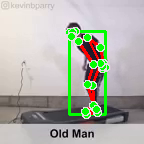

no fall detected
centroid drop:  0.41161035001277924
fall frames:  3
fall threshold:  6
box width:  35.37756013870239
box height:  82.99724793434143


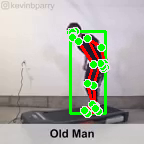

no fall detected
centroid drop:  0.35034383833408356
fall frames:  3
fall threshold:  6
box width:  35.54080581665039
box height:  82.29606485366821


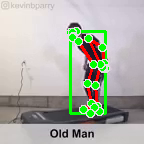

no fall detected
centroid drop:  0.26171110570430756
fall frames:  3
fall threshold:  6
box width:  35.56830596923828
box height:  81.77252125740051


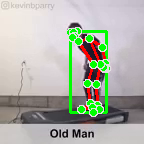

no fall detected
centroid drop:  0.25285832583904266
fall frames:  3
fall threshold:  6
box width:  35.72001600265503
box height:  81.26665878295898


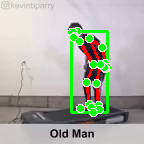

no fall detected
centroid drop:  0.09358260035514832
fall frames:  3
fall threshold:  6
box width:  35.76492261886597
box height:  81.079354763031


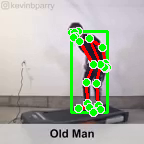

no fall detected
centroid drop:  -0.0007929801940917969
fall frames:  3
fall threshold:  6
box width:  35.2879056930542
box height:  81.08093404769897


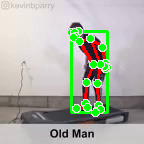

no fall detected
centroid drop:  0.06870251893997192
fall frames:  3
fall threshold:  6
box width:  35.040146827697754
box height:  80.94323587417603


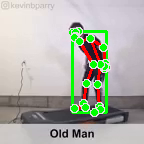

no fall detected
centroid drop:  0.15524587035179138
fall frames:  3
fall threshold:  6
box width:  34.54128170013428
box height:  80.63186359405518


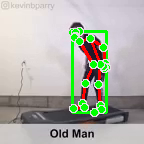

no fall detected
centroid drop:  0.04435092210769653
fall frames:  3
fall threshold:  6
box width:  34.11797332763672
box height:  80.54269409179688


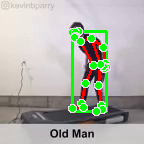

no fall detected
centroid drop:  0.00039239227771759033
fall frames:  3
fall threshold:  6
box width:  33.906864166259766
box height:  80.54267907142639


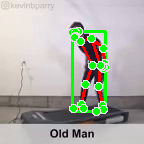

no fall detected
centroid drop:  -0.03566110134124756
fall frames:  3
fall threshold:  6
box width:  33.04068660736084
box height:  80.61492276191711


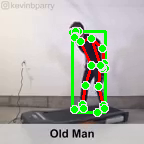

no fall detected
centroid drop:  -0.0646311491727829
fall frames:  3
fall threshold:  6
box width:  32.34123516082764
box height:  80.74532747268677


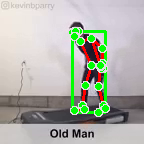

no fall detected
centroid drop:  -0.04753841459751129
fall frames:  3
fall threshold:  6
box width:  32.74131774902344
box height:  80.84139561653137


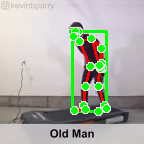

no fall detected
centroid drop:  0.04482549428939819
fall frames:  3
fall threshold:  6
box width:  33.74945068359375
box height:  80.75165104866028


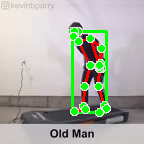

no fall detected
centroid drop:  -0.010673895478248596
fall frames:  3
fall threshold:  6
box width:  34.97769641876221
box height:  80.77290916442871


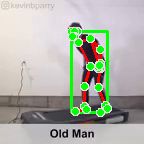

no fall detected
centroid drop:  0.009075596928596497
fall frames:  3
fall threshold:  6
box width:  36.47452354431152
box height:  80.75443196296692


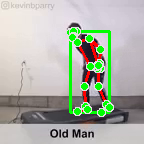

no fall detected
centroid drop:  0.04433664679527283
fall frames:  3
fall threshold:  6
box width:  38.401469707489014
box height:  80.66434836387634


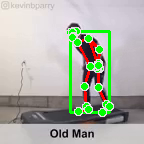

no fall detected
centroid drop:  0.11353625357151031
fall frames:  3
fall threshold:  6
box width:  39.02982759475708
box height:  80.4343843460083


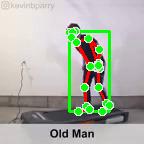

no fall detected
centroid drop:  0.18522629141807556
fall frames:  3
fall threshold:  6
box width:  39.74617052078247
box height:  80.05987501144409


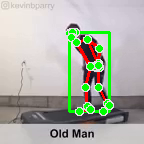

no fall detected
centroid drop:  0.20072397589683533
fall frames:  3
fall threshold:  6
box width:  40.11757707595825
box height:  79.65414905548096


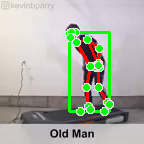

no fall detected
centroid drop:  0.06929619610309601
fall frames:  3
fall threshold:  6
box width:  40.65153408050537
box height:  79.51346611976624


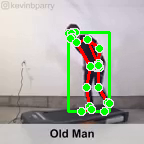

no fall detected
centroid drop:  0.14217807352542877
fall frames:  3
fall threshold:  6
box width:  40.73773384094238
box height:  79.22741174697876


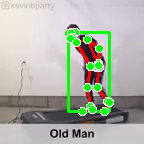

no fall detected
centroid drop:  0.12125471234321594
fall frames:  3
fall threshold:  6
box width:  41.00726366043091
box height:  78.98362255096436


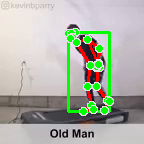

no fall detected
centroid drop:  0.05116145312786102
fall frames:  3
fall threshold:  6
box width:  40.85939884185791
box height:  78.8803403377533


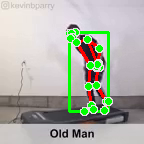

no fall detected
centroid drop:  0.017623215913772583
fall frames:  3
fall threshold:  6
box width:  39.80779266357422
box height:  78.84467339515686


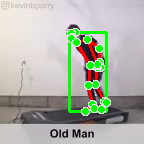

no fall detected
centroid drop:  0.009647592902183533
fall frames:  3
fall threshold:  6
box width:  37.71437358856201
box height:  78.82527351379395


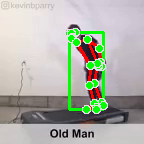

no fall detected
centroid drop:  0.7353980541229248
fall frames:  4
fall threshold:  6
box width:  34.57101345062256
box height:  77.3545389175415


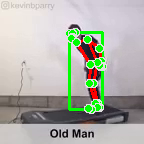

no fall detected
centroid drop:  0.18972784280776978
fall frames:  4
fall threshold:  6
box width:  32.763333320617676
box height:  76.97494411468506


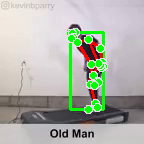

no fall detected
centroid drop:  0.22693178057670593
fall frames:  4
fall threshold:  6
box width:  33.338579177856445
box height:  76.5211615562439


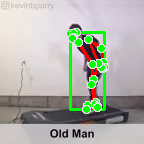

no fall detected
centroid drop:  -0.08219455182552338
fall frames:  4
fall threshold:  6
box width:  34.01692485809326
box height:  76.68613886833191


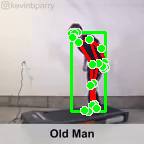

no fall detected
centroid drop:  -1.4189704209566116
fall frames:  4
fall threshold:  6
box width:  34.60792922973633
box height:  79.52924394607544


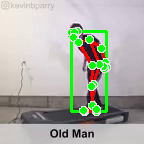

no fall detected
centroid drop:  -0.27478861808776855
fall frames:  4
fall threshold:  6
box width:  34.71587419509888
box height:  80.08336687088013


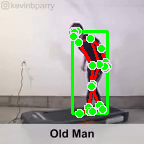

no fall detected
centroid drop:  -0.8274383544921875
fall frames:  4
fall threshold:  6
box width:  35.35493087768555
box height:  81.7435040473938


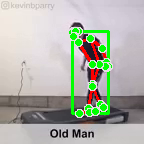

no fall detected
centroid drop:  -0.5639887154102325
fall frames:  4
fall threshold:  6
box width:  35.90898513793945
box height:  82.87730598449707


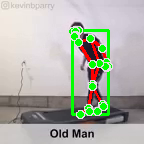

no fall detected
centroid drop:  -0.35932891070842743
fall frames:  4
fall threshold:  6
box width:  35.7192907333374
box height:  83.60502362251282


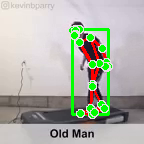

no fall detected
centroid drop:  -0.4406176656484604
fall frames:  4
fall threshold:  6
box width:  35.50459384918213
box height:  84.49698686599731


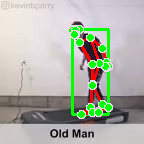

no fall detected
centroid drop:  -0.1370377391576767
fall frames:  4
fall threshold:  6
box width:  36.125407218933105
box height:  84.77709746360779


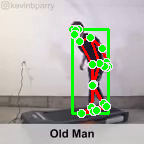

no fall detected
centroid drop:  0.05862928926944733
fall frames:  4
fall threshold:  6
box width:  35.514163970947266
box height:  84.6631851196289


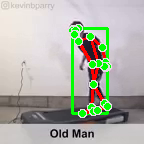

no fall detected
centroid drop:  0.03501106798648834
fall frames:  4
fall threshold:  6
box width:  35.384825706481934
box height:  84.59338116645813


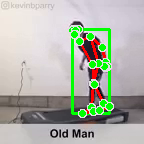

no fall detected
centroid drop:  -0.04272155463695526
fall frames:  4
fall threshold:  6
box width:  36.88195323944092
box height:  84.67835569381714


In [ ]:
detect_mp4(Walking_path)